# S&P 500 Network Analysis
## Data 620 Final Project

### Group Memebers: Layla Quinones, Maliat Islam, Karim Hammoud

<a href = "http://youtu.be/i-2cuQnnfKg?hd=1"> YOUTUBE LINK PART 1</a>

<a href = "http://youtu.be/sXoqsqw6xUY?hd=1">YOUTUBE LINK PART 2 </a>

<a href = "">YOUTUBE LINK PART 3</a>

## Introduction
The Standard & Poor 500 stock market index (S&P 500) is a data source that is upated and published daily which is widly used as investiment benchmarks for brokers, and  to issue credit ratings to determine debt obligations for major companies. It consists of 505 common stocks issued by large-cap companies that trade on American stock exchanges (including the 30 companies that compose the Dow Jones Industrial Average), and covers about 80 percent of the American equity market by capitalization. 

In this project we use various web analytics tools to generate multiple network perspectives for each company in the S&P 500. We employ network tools from the <code>networkx</code> library to help uncover relationships between companies from data extracted via web scraping, and from the Yahoo Finance Api available in python. We then conduct sentiment analysis in twitter to uncover sentiments about key companies in the S&P network. 

## S&P Network via Web Scraping
In this section categorical data for S&P 500 companies were scraped from the following <a href = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies">Wikipedia page</a>, and quantitative data containing the weights assigned to each company was downloaded from <a href = "https://www.slickcharts.com/sp500">Slickcharts.com</a>. Information from both data sources were merged and used to generate an initial network graph, which was then used to create a projected network to extract insights between companies. Please refer to comments in the code chunks below for more detailed information on the workflow. 

In [143]:
# Load the required libraries for project
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import networkx as nx
import warnings
from networkx.algorithms import bipartite as bi
import pandas_datareader.data as reader
import datetime as dt
import statsmodels.api as sm
from pandas_datareader.nasdaq_trader import get_nasdaq_symbols
import tweepy
from textblob import TextBlob
from wordcloud import wordcloud
import re
import seaborn as sns
from scipy import stats as stat
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
import json
import yfinance as yf
import sys
import jsonpickle
from afinn import Afinn

In [144]:
# There are 2 tables on the Wikipedia page, we are interested in the first one only
# Using pandas library to scrape the table from the page
payload=pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
wiki = payload[0] #first table only

#####Data Cleaning######
#renaming the columns
wiki.columns = ['Symbol', 'Security', 'filings', 'Sector', 'Sub_Industry', 'Headquarters', 'Date_added', 'CIK', 'Founded']

# Split the city and state and create new column for state
wiki['State'] = wiki['Headquarters'].apply(lambda x: x.split(',')[1] if ',' in x else '')

# We noticed all of the empty values in State column are related to New York City
wiki['State'] = wiki['State'].str.strip()
wiki['State'] = wiki['State'].replace('', 'New York')

wiki.at[56,'State']='Virginia'
wiki.at[73,'State']='Massachusetts'
wiki.at[134,'State']='Washington'
wiki.at[274,'State']='Illinois'
wiki.head()

,Symbol,Security,filings,Sector,Sub_Industry,Headquarters,Date_added,CIK,Founded,State
0,MMM,3M,reports,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1976-08-09,66740,1902,Minnesota
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800,1888,Illinois
2,ABBV,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888),Illinois
3,ABMD,Abiomed,reports,Health Care,Health Care Equipment,"Danvers, Massachusetts",2018-05-31,815094,1981,Massachusetts
4,ACN,Accenture,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989,Ireland


In [145]:
# Get weights and price per stock from github - from slickcharts.com/sp500
weights=pd.read_csv('https://raw.githubusercontent.com/akarimhammoud/DATA-620/main/Week_6_final%20project/weights.csv')
weights.drop(['#', 'Chg', '% Chg'], axis='columns', inplace=True)
weights.rename(columns={list(weights.columns)[3]: 'Price'}, inplace=True, errors='raise')
weights.head()

,Company,Symbol,Weight,Price
0,Apple Inc.,AAPL,6.151855,145.08
1,Microsoft Corporation,MSFT,5.720618,277.85
2,Amazon.com Inc.,AMZN,4.379672,"3,716.00"
3,Facebook Inc. Class A,FB,2.267526,350.60
4,Alphabet Inc. Class A,GOOGL,2.059196,"2,508.49"


In [146]:
# Merge both datasets
df = pd.merge(wiki, weights, on ='Symbol',how ='inner')
df.head()

,Symbol,Security,filings,Sector,Sub_Industry,Headquarters,Date_added,CIK,Founded,State,Company,Weight,Price
0,MMM,3M,reports,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1976-08-09,66740,1902,Minnesota,3M Company,0.313848,201.00
1,ABT,Abbott Laboratories,reports,Health Care,Health Care Equipment,"North Chicago, Illinois",1964-03-31,1800,1888,Illinois,Abbott Laboratories,0.580172,119.74
2,ABBV,AbbVie,reports,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888),Illinois,AbbVie Inc.,0.561722,116.58
3,ABMD,Abiomed,reports,Health Care,Health Care Equipment,"Danvers, Massachusetts",2018-05-31,815094,1981,Massachusetts,ABIOMED Inc.,0.040224,324.77
4,ACN,Accenture,reports,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989,Ireland,Accenture Plc Class A,0.538042,312.62


### Initial Network Creation
The table above was used to create an initial network with States and Sectors as nodes. We were interested in first identifying the states and sectors with the highest number of connections, which may indicate key players in the S&P network. 

In [147]:
#Network nodes (State and Sector)
G = nx.Graph()
G = nx.from_pandas_edgelist(df, source= 'State', target='Sector',edge_attr=True)

#add the attributes
nx.set_node_attributes(G, df['Weight'], 'Weight')
nx.set_node_attributes(G, df['Sub_Industry'], 'Sub_Industry')
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 56
Number of edges: 205
Average degree:   7.3214


In [148]:
#Fully connected network with one component
print(f"Number of components: {nx.number_connected_components(G)} \nIs it fully connected? {nx.is_connected(G)}")

Number of components: 1 
Is it fully connected? True


In [149]:
# Display top degree States (States with most connections)
sector = list(df.Sector.unique())
state = list(df.State.unique())
headquarter = list(df.Headquarters.unique())

#NUMBER OF CONNECTIONS FOR HEADQUARTERS
gd=pd.DataFrame(G.degree(state)).sort_values(1,ascending =False).rename({0:'State:',1:'DEGREE'}, axis=1).set_index("State:")
print("Degree: \n", gd[0:10])

Degree: 
                 DEGREE
State:                
California          11
New York            11
Texas               11
Pennsylvania         9
Illinois             9
Ohio                 9
Minnesota            7
Connecticut          7
Florida              7
North Carolina       7


In [150]:
#NUMBER OF CONNECTIONS FOR SECTORS
gd=pd.DataFrame(G.degree(sector)).sort_values(1,ascending =False).rename({0:'Sector:',1:'DEGREE'}, axis=1).set_index("Sector:")
print("Degree: \n", gd)

Degree: 
                         DEGREE
Sector:                       
Industrials                 27
Consumer Discretionary      26
Financials                  26
Health Care                 22
Information Technology      22
Utilities                   19
Materials                   19
Consumer Staples            16
Real Estate                 14
Communication Services       8
Energy                       6


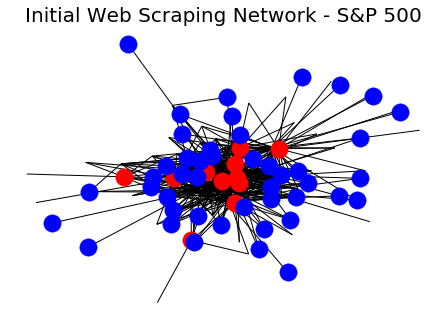

In [151]:
#visualize the network of sectors and states
nx.draw(G, nodelist = sector, node_color = 'red')
nx.draw(G, nodelist = state, node_color = 'blue')
plt.title('Initial Web Scraping Network - S&P 500', fontsize = 20, color = 'black')
plt.show()

#### Initial Analysis
From the initial network that was generated based on web scraping and weighted data, we can clearly see that key states that play a large role in this network include Texas, California and New York (with a total of 11 connections to companies in the network. On the other hand we can see that the key industries that play a large role in this network include Industrials, Consumer Discretionary and Financials with 27 and 26 connections respectivley. 

It is interesting to note that these findings reflect what was expected in that Texas and California, besides being in the top 3 larges states in the country, has become a popular location for companies to move due to reasons such as lower income tax and having major cities with large tech company communities (<a href = "https://www.cnbc.com/2021/03/20/how-texas-attracts-big-businesses-billionaires-from-california.html">SOURCE</a>.  In addition New York City, being the home of the New York Stock Exchange, has always been attractive for companies due to the prestige and image associated with that location. (<a href = "https://www.cnbc.com/2020/10/31/why-high-earners-in-finance-and-tech-left-new-york-city.html">SOURCE<a>.  

### Projected Networks
We wanted to get a better idea of the relationships between states and sectors so we continued our analysis by employing a network projection for each, visualizing and analyzing centrality measures.

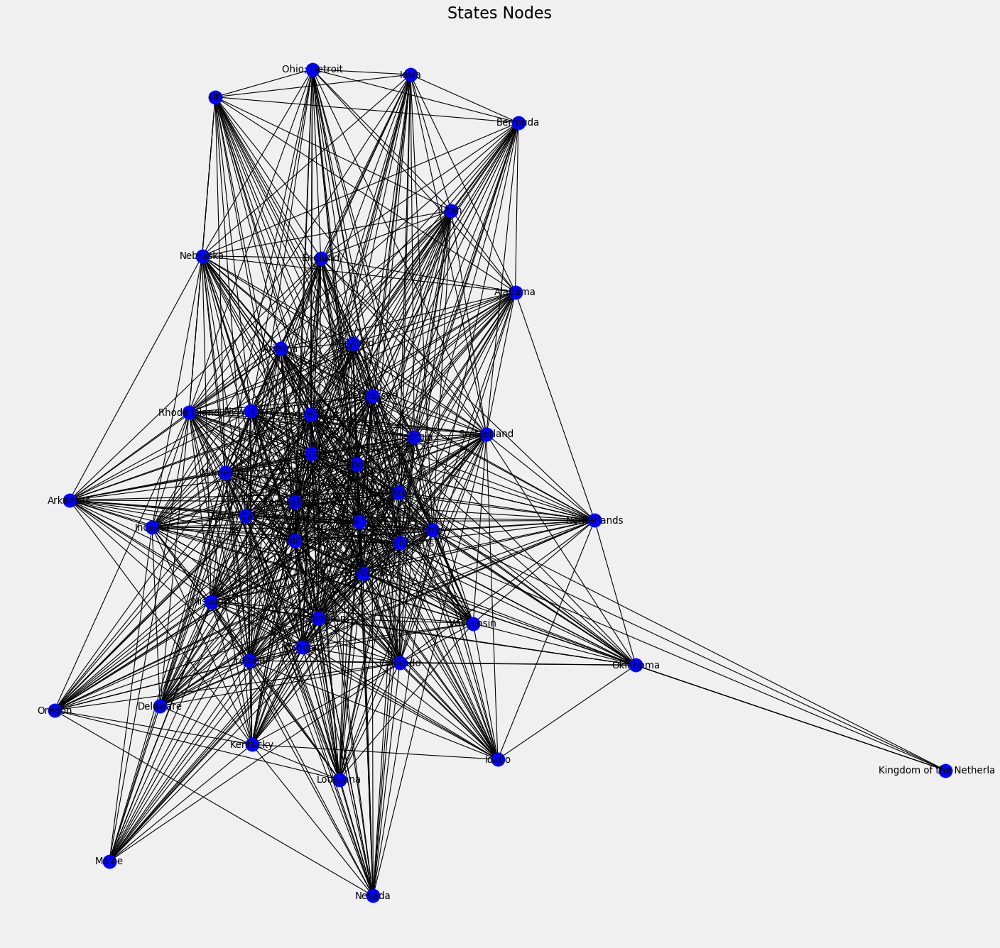

In [152]:
# create an affiliation network (spring layout)
netstate = bi.weighted_projected_graph(G, state)
netsector = bi.weighted_projected_graph(G, sector)

#Visualize entire  network of states
pos = nx.spring_layout(netstate)
plt.figure(num=None, figsize=(20, 20), dpi=80)
plt.axis('off')
fig = plt.figure(1)
nx.draw_networkx_nodes(netstate,pos, node_color = 'b')
nx.draw_networkx_edges(netstate,pos, node_color = 'b')
nx.draw_networkx_labels(netstate,pos)
plt.title('States Nodes',size = 20)

cut = 1.00
plt.show()

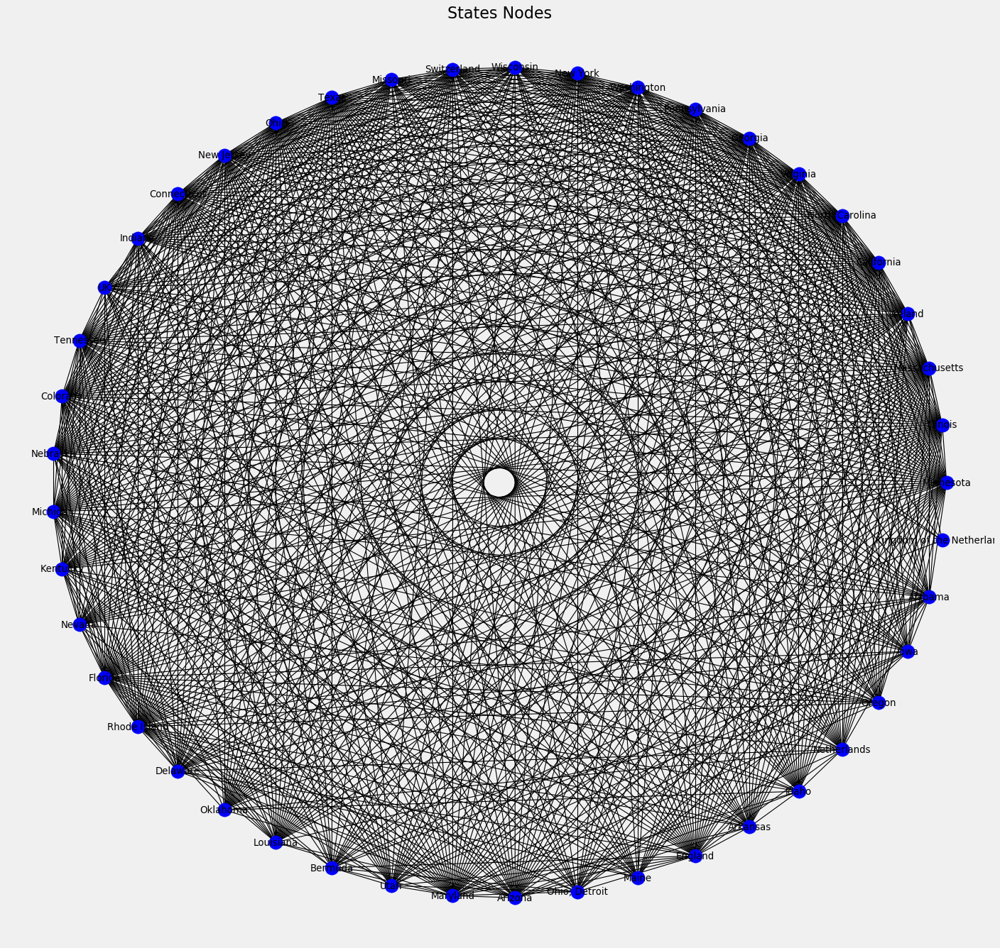

In [153]:
#Visualize entire  network of states (circular)
pos = positions=nx.circular_layout(netstate)
plt.figure(num=None, figsize=(20, 20), dpi=80)
plt.axis('off')
fig = plt.figure(1)
nx.draw_networkx_nodes(netstate,pos, node_color = 'b')
nx.draw_networkx_edges(netstate,pos, node_color = 'b')
nx.draw_networkx_labels(netstate,pos)
plt.title('States Nodes',size = 20)

cut = 1.00
plt.show()

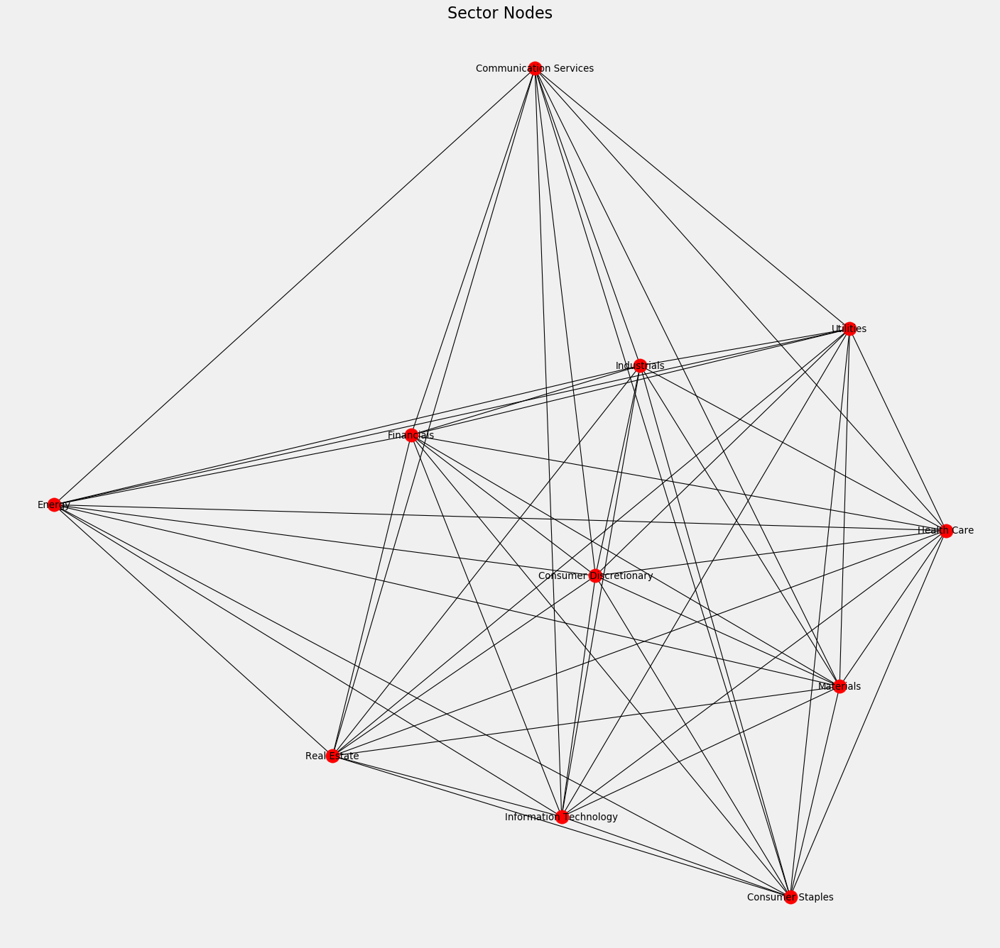

In [154]:
#Visualize entire  network of sectors
pos = nx.spring_layout(netsector)
plt.figure(num=None, figsize=(20, 20), dpi=80)
plt.axis('off')
fig = plt.figure(1)
nx.draw_networkx_nodes(netsector,pos, node_color = 'r')
nx.draw_networkx_edges(netsector,pos, node_color = 'r')
nx.draw_networkx_labels(netsector,pos)
plt.title('Sector Nodes',size = 20)

cut = 1.00
plt.show()

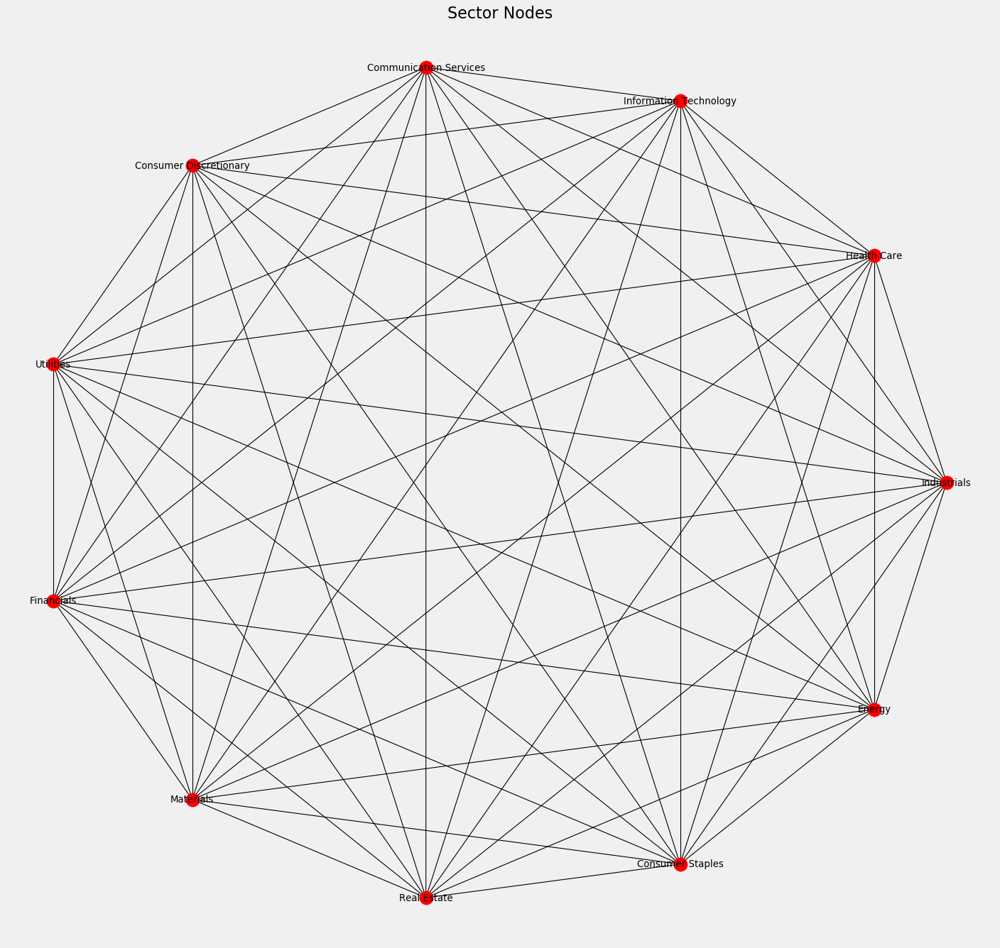

In [155]:
#Visualize entire  network of states (circular)
pos = positions=nx.circular_layout(netsector)
plt.figure(num=None, figsize=(20, 20), dpi=80)
plt.axis('off')
fig = plt.figure(1)
nx.draw_networkx_nodes(netsector,pos, node_color = 'r')
nx.draw_networkx_edges(netsector,pos, node_color = 'r')
nx.draw_networkx_labels(netsector,pos)
plt.title('Sector Nodes',size = 20)

cut = 1.00
plt.show()

#### Measures of Centrality
To get a quantitative sense of the importance of nodes, we calculated measures of centrality for each state node to aid our analysis.

In [249]:
#closeness
closeness = nx.closeness_centrality(netstate)
#betweenness
betweenness = nx.betweenness_centrality(netstate)
#eigenvector
eigenvector = nx.eigenvector_centrality(netstate)

#put everything in a dataframe for easy comparison
closenessDF = pd.DataFrame.from_dict(closeness.items())
closenessDF.rename(columns={0: 'State',1: 'Closeness'},inplace=True, errors='raise')

betweennessDF = pd.DataFrame.from_dict(betweenness.items())
betweennessDF.rename(columns={0: 'State',1: 'Betweenness'},inplace=True, errors='raise')

eigenvectorDF = pd.DataFrame.from_dict(eigenvector.items())
eigenvectorDF.rename(columns={0: 'State',1: 'Eigenvector'},inplace=True, errors='raise')

centDF = closenessDF.merge(betweennessDF, how='outer',on='State')
centDF = centDF.merge(eigenvectorDF, how='outer',on='State')
centDF.sort_values(by=['Closeness'],ascending=False)[0:10]

,State,Closeness,Betweenness,Eigenvector
15,Ohio,1.000000,0.018931,0.177163
4,California,1.000000,0.018931,0.177163
10,New York,1.000000,0.018931,0.177163
14,Texas,1.000000,0.018931,0.177163
2,Massachusetts,0.977778,0.009575,0.176556
1,Illinois,0.977778,0.009575,0.176556
5,North Carolina,0.977778,0.009575,0.176556
8,Pennsylvania,0.977778,0.009575,0.176556
17,Connecticut,0.977778,0.009575,0.176556
0,Minnesota,0.956522,0.008314,0.173826


In [250]:
# Count the number of companies per state
count = df.groupby('State').count()
count = count.iloc[:, 0]
count.sort_values(ascending=False)[0:8]

State
California       74
New York         56
Texas            40
Illinois         35
Massachusetts    22
Pennsylvania     18
Ohio             18
Georgia          17
Name: Symbol, dtype: int64

In [252]:
#closeness
closeness2 = nx.closeness_centrality(netsector)
#betweenness
betweenness2 = nx.betweenness_centrality(netsector)
#eigenvector
eigenvector2 = nx.eigenvector_centrality(netsector)

#put everything in a dataframe for easy comparison
closenessDF2 = pd.DataFrame.from_dict(closeness2.items())
closenessDF2.rename(columns={0: 'Sector',1: 'Closeness'},inplace=True, errors='raise')

betweennessDF2 = pd.DataFrame.from_dict(betweenness2.items())
betweennessDF2.rename(columns={0: 'Sector',1: 'Betweenness'},inplace=True, errors='raise')

eigenvectorDF2 = pd.DataFrame.from_dict(eigenvector2.items())
eigenvectorDF2.rename(columns={0: 'Sector',1: 'Eigenvector'},inplace=True, errors='raise')

centDF2 = closenessDF2.merge(betweennessDF2, how='outer',on='Sector')
centDF2 = centDF2.merge(eigenvectorDF2, how='outer',on='Sector')
centDF2.sort_values(by=['Closeness'],ascending=False)[0:10]

,Sector,Closeness,Betweenness,Eigenvector
0,Industrials,1.0,0.0,0.301511
1,Health Care,1.0,0.0,0.301511
2,Information Technology,1.0,0.0,0.301511
3,Communication Services,1.0,0.0,0.301511
4,Consumer Discretionary,1.0,0.0,0.301511
5,Utilities,1.0,0.0,0.301511
6,Financials,1.0,0.0,0.301511
7,Materials,1.0,0.0,0.301511
8,Real Estate,1.0,0.0,0.301511
9,Consumer Staples,1.0,0.0,0.301511


In [255]:
# Count the number of companies per state
count2 = df.groupby('Sector').count()
count2 = count2.iloc[:, 0]
count2.sort_values(ascending=False)[0:8]

Sector
Information Technology    74
Industrials               74
Financials                65
Health Care               63
Consumer Discretionary    63
Consumer Staples          32
Real Estate               29
Utilities                 28
Name: Symbol, dtype: int64

#### Projected Network Analysis
From the above projected network analysis we can confirm that California, New York and Texas continue to lead in terms of network importance - they have the same closeness, betweenness and eignenvector centrality measurments. Interestingly enough, we see that Ohio is emerging from this analysis as a fourth state valued at the same importance as the ones previously identified from the initial network. Despite the fact that it does not have nearly as many companies located in the state, centrality measures in the projected networks show that Ohio is prominent contributor in this network. It would interesting to analyze companies within this state to determine which ones are causing the state to gain such prominence. 

Centrality measures for the sectors projected network did not provide any further insight into relationships between nodes because all measurements were identicle. 

#### Island Method - States
After analyzing the projected networks for states, we decided to proceed with implementing the island method to further reduce the network and incover relationships between groups of states.

In [157]:
# Trim Edges
#This function trims connections with a weight of 1
def trim_edges(g, weight = 1):
    edges = []
    g2 = nx.Graph()
    for f, to, edata in g.edges(data=True):
        if edata['weight']> weight:
            x = float(edata['weight'])
            edges.append((f,to,x))
    g2.add_weighted_edges_from(edges)
    return g2

# Island Method
#Employs trim edegs for a range of weights (5 iterations)
def island_method(g, iterations=5):
    weights = [edata['weight'] for f, to, edata in g.edges(data=True)]
    
    #size of step
    mn=int(min(weights))
    mx=int(max(weights))
    step = int((mx-mn)/iterations)
    
    return [[threshold, trim_edges(g, threshold)] for threshold in range(mn, mx, step)]

In [158]:
# Run the island method on state projected network
state_island = island_method(netstate)

#create a Dataframe for display of subnetwork data
dataList = []
for i in state_island:
    dataList.append((i[0], nx.number_of_nodes(i[1]), nx.number_of_edges(i[1]), nx.number_connected_components(i[1])))
pd.DataFrame(dataList, columns =['Threshold', 'Nodes', 'Edges', '# Connected Components'])

,Threshold,Nodes,Edges,# Connected Components
0,1,37,462,1
1,3,25,217,1
2,5,18,87,1
3,7,6,14,1
4,9,3,3,1


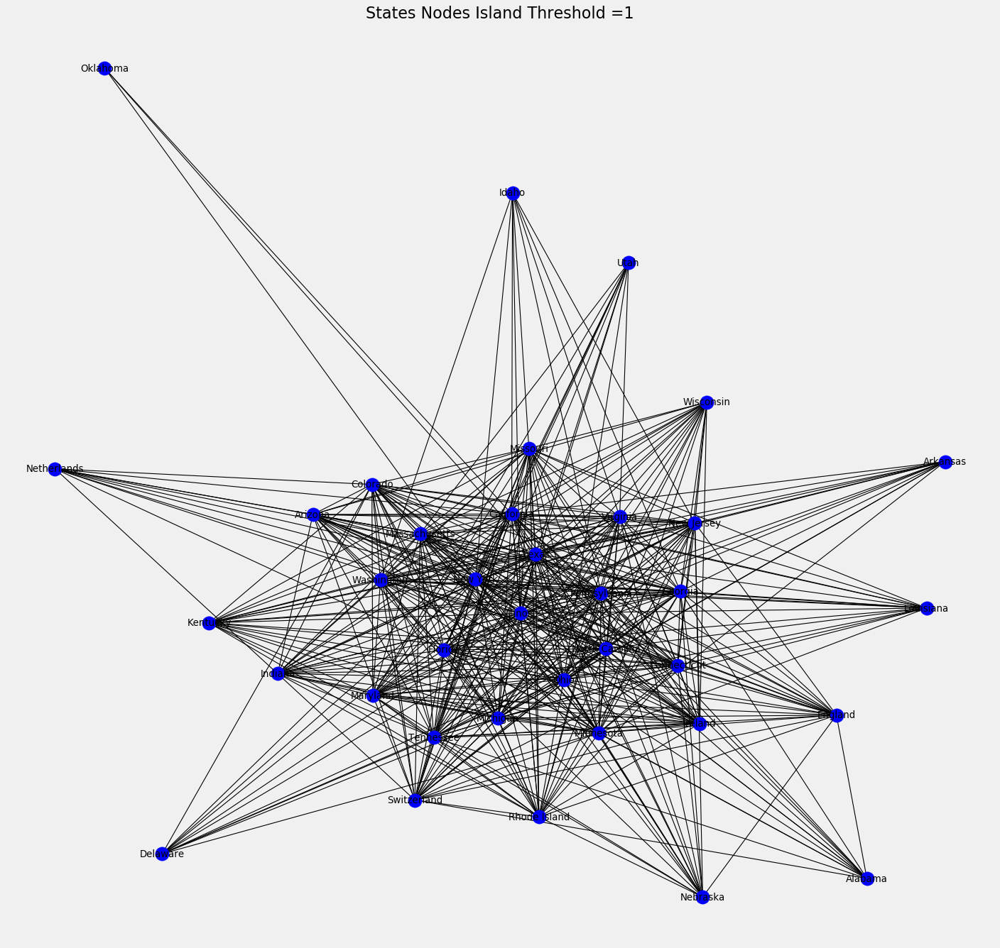

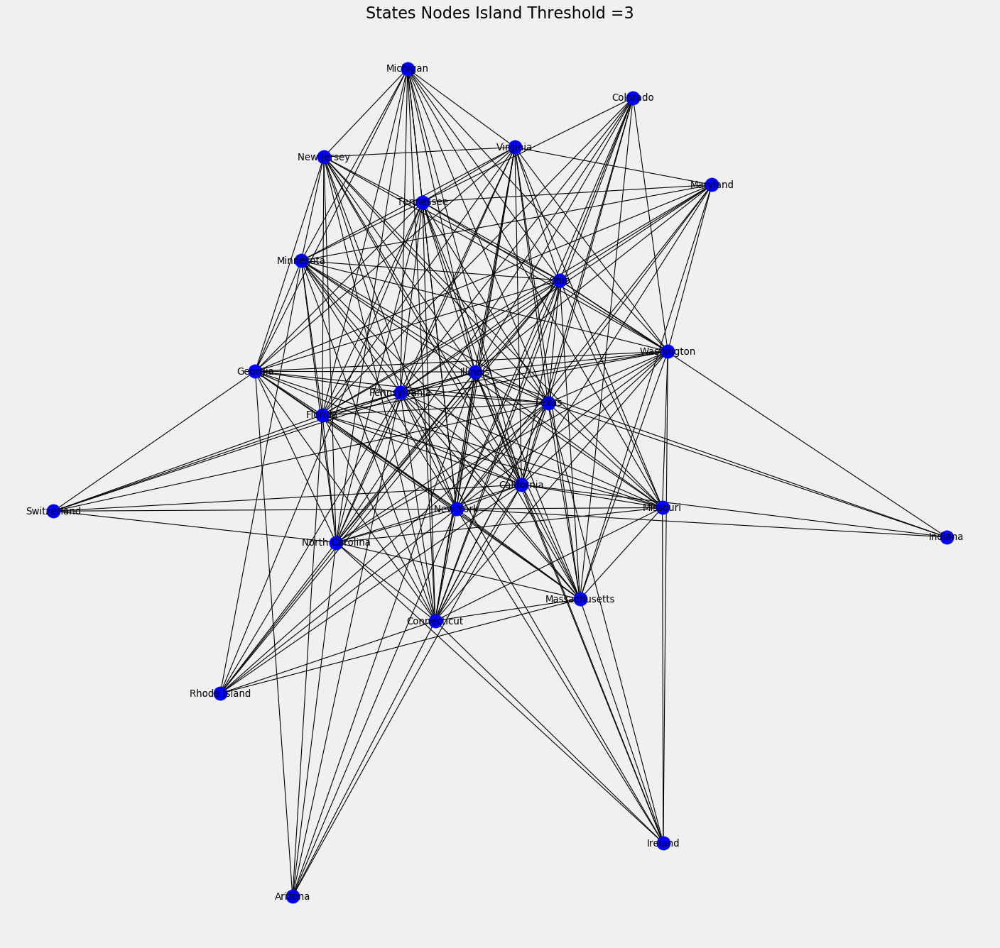

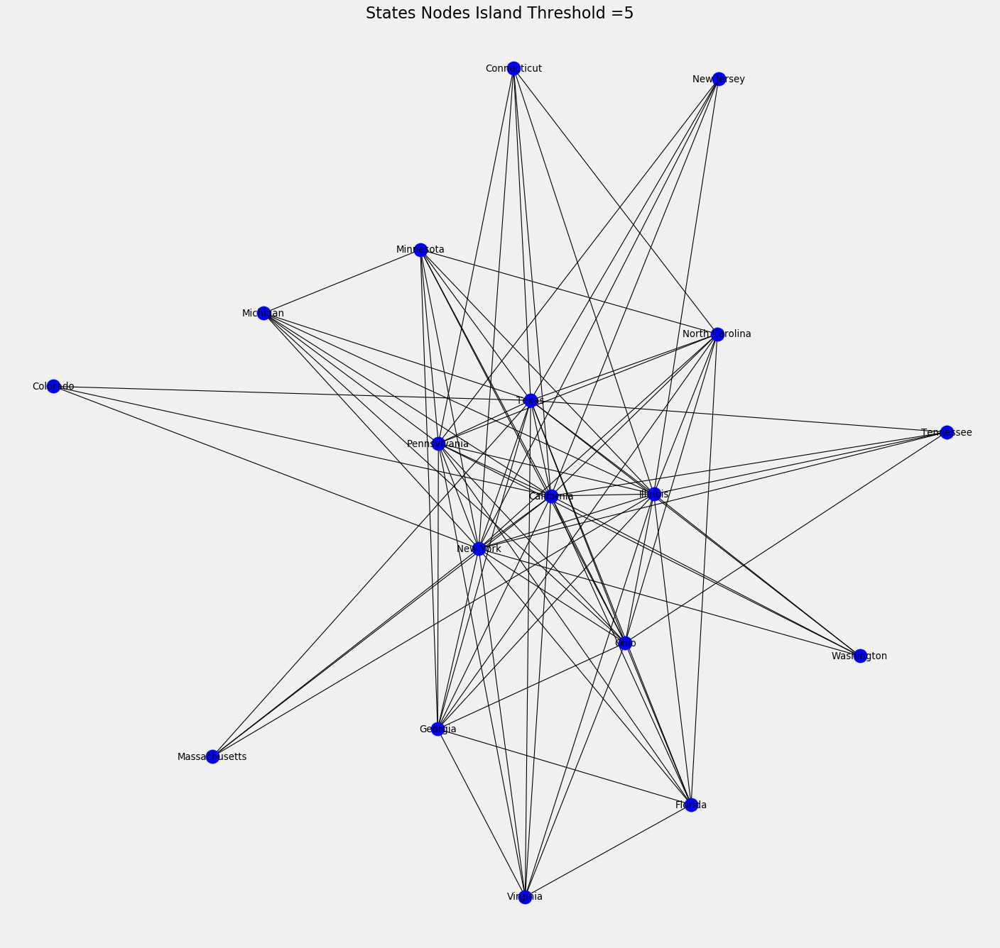

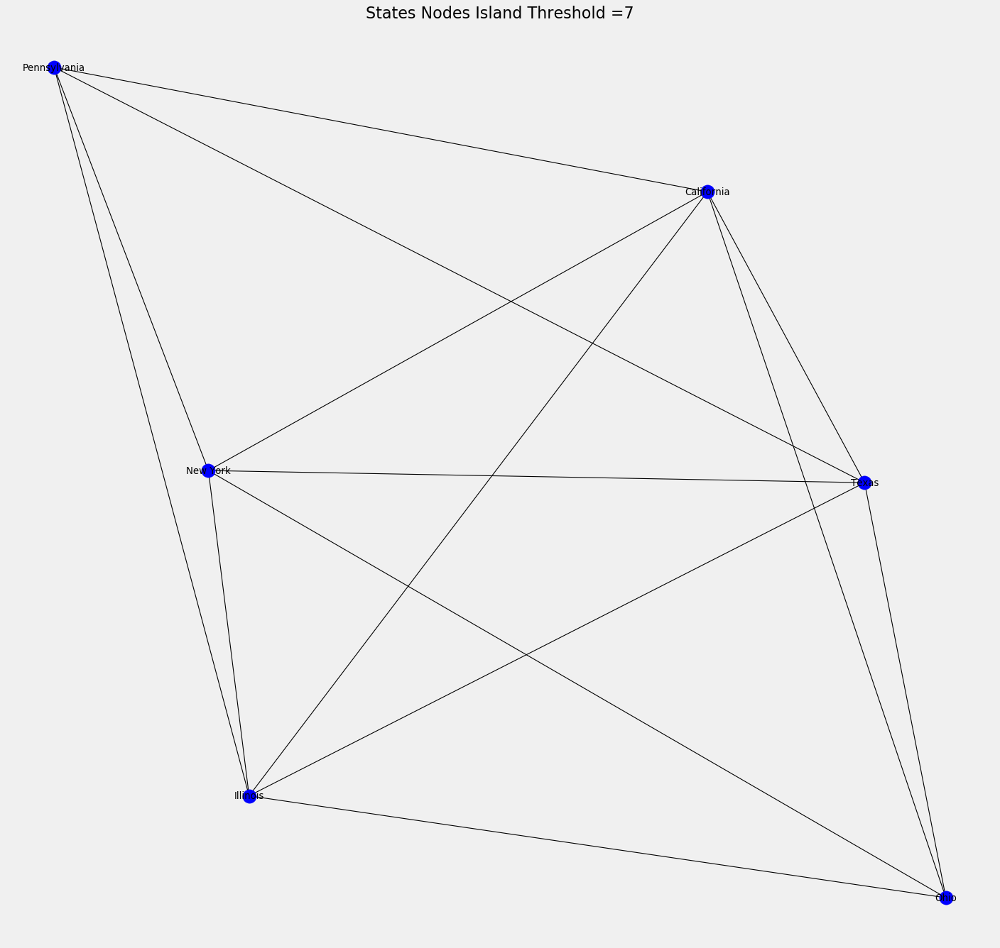

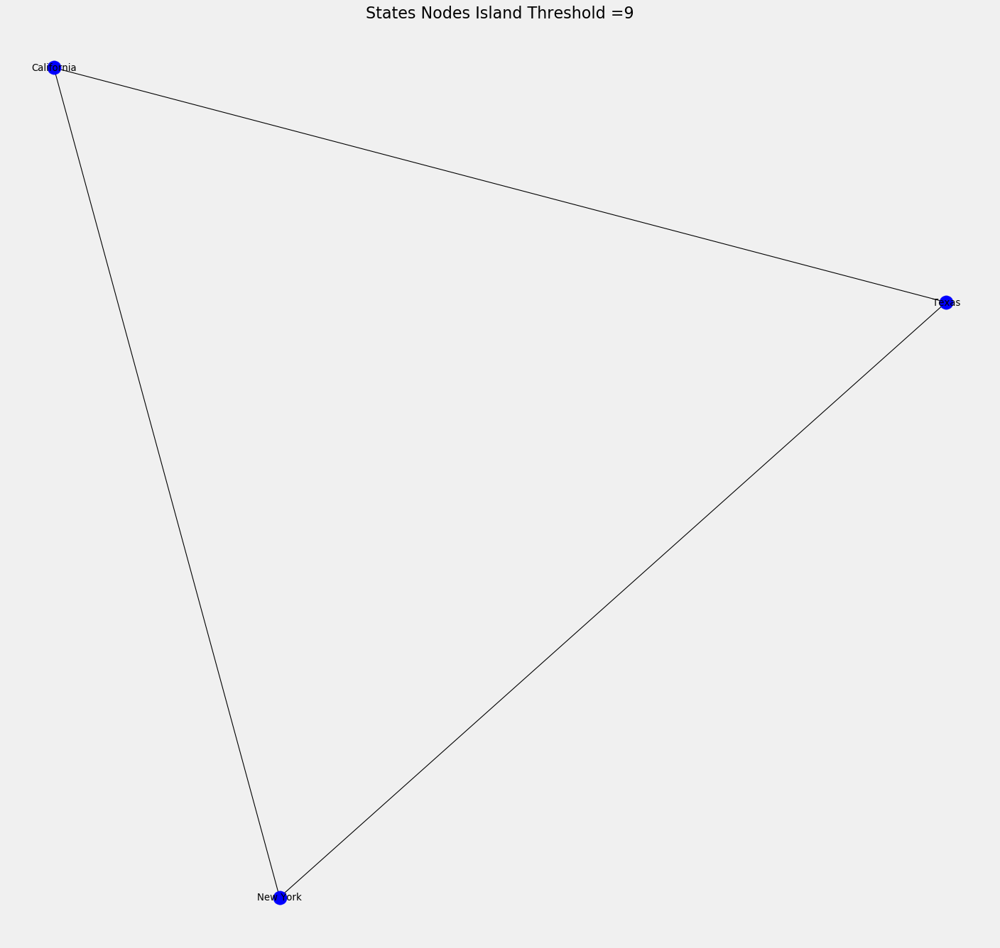

In [159]:
for i in range(len(state_island)):
    #Visualize sub-networks (islands)
    pos = nx.spring_layout(state_island[i][1])
    plt.figure(num=None, figsize=(20, 20), dpi=80)
    plt.axis('off')
    fig = plt.figure(1)
    nx.draw_networkx_nodes(state_island[i][1],pos, node_color = 'b')
    nx.draw_networkx_edges(state_island[i][1],pos, node_color = 'b')
    nx.draw_networkx_labels(state_island[i][1],pos)
    plt.title('States Nodes Island Threshold =' + str(state_island[i][0]),size = 20)

    cut = 1.00
    plt.show()

#### States Projected Network - Island Method Analysis
As seen in the visualization above, the states within specific sub-networks are now begginig to cluster together. In each slice of the network we start to see less promonant states drop off until we reach the last graph where you can see that New York, California and Texas are the most prominent nodes in this network - which agrees with previous analysis. It is interesting to note that in this perspective, we do not see Ohio included in the last graph which indicates that it is in fact, not as prominent as the other three as previously thought.

#### Island Method - Sectors
After analyzing the projected networks for sectors, we decided to proceed with implementing the island method to further reduce the network and incover relationships between groups of sectors (since previous analysis did not yeild any useful insights)

In [160]:
# Run the island method on state projected network
state_island2 = island_method(netsector)

#create a Dataframe for display of subnetwork data
dataList2 = []

for i in state_island2:
    dataList2.append((i[0], nx.number_of_nodes(i[1]), nx.number_of_edges(i[1]), nx.number_connected_components(i[1])))

pd.DataFrame(dataList2, columns =['Threshold', 'Nodes', 'Edges', '# Connected Components'])

,Threshold,Nodes,Edges,# Connected Components
0,3,11,54,1
1,6,10,39,1
2,9,9,31,1
3,12,8,20,1
4,15,6,8,1
5,18,3,2,1


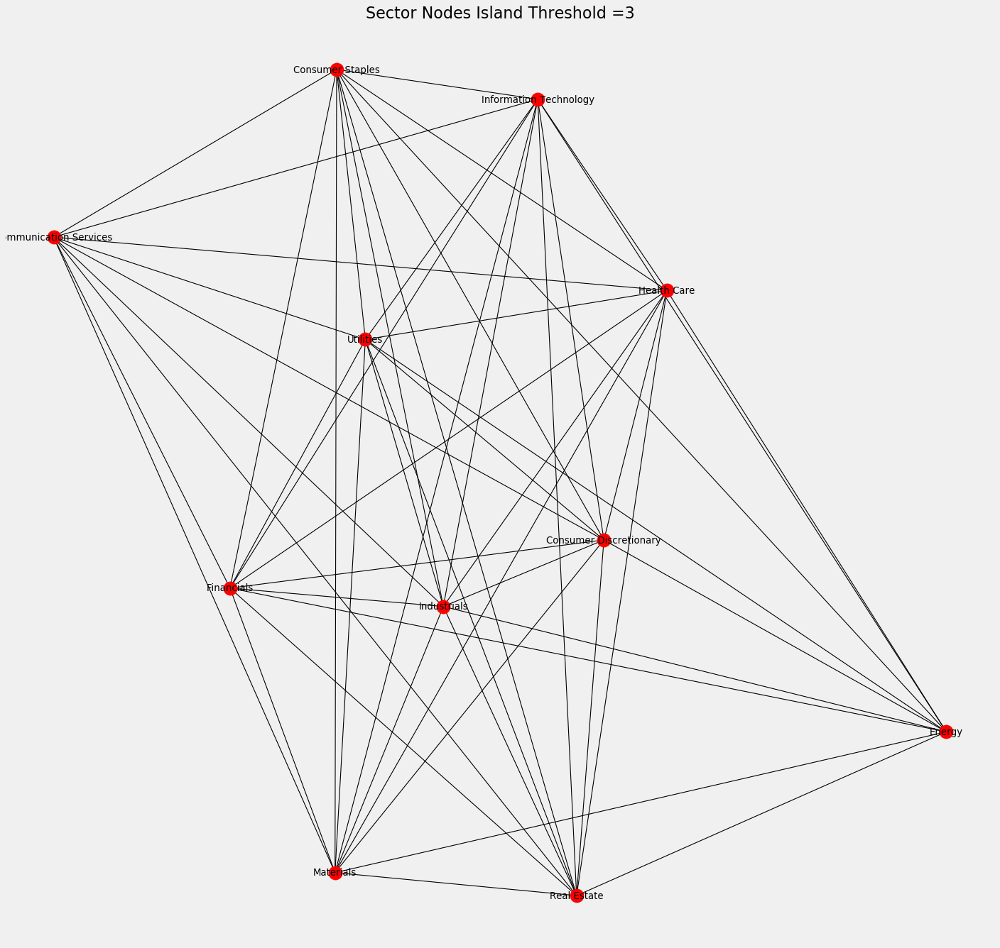

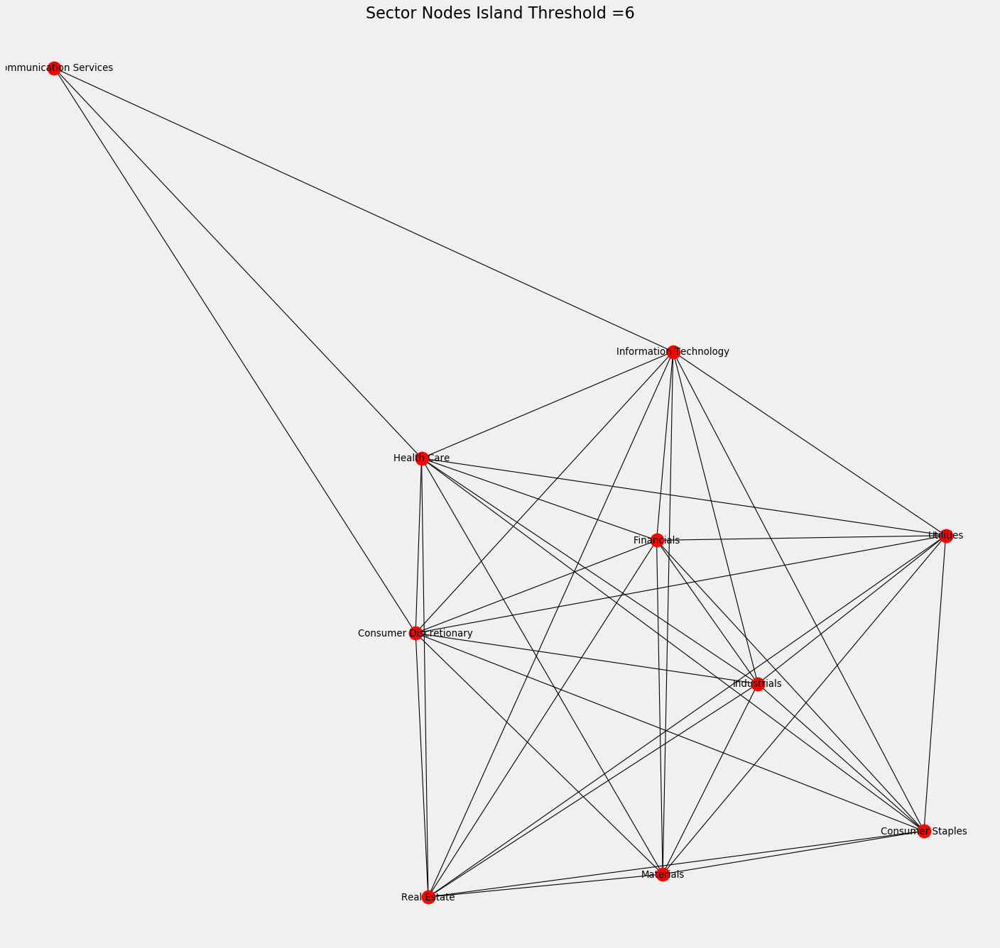

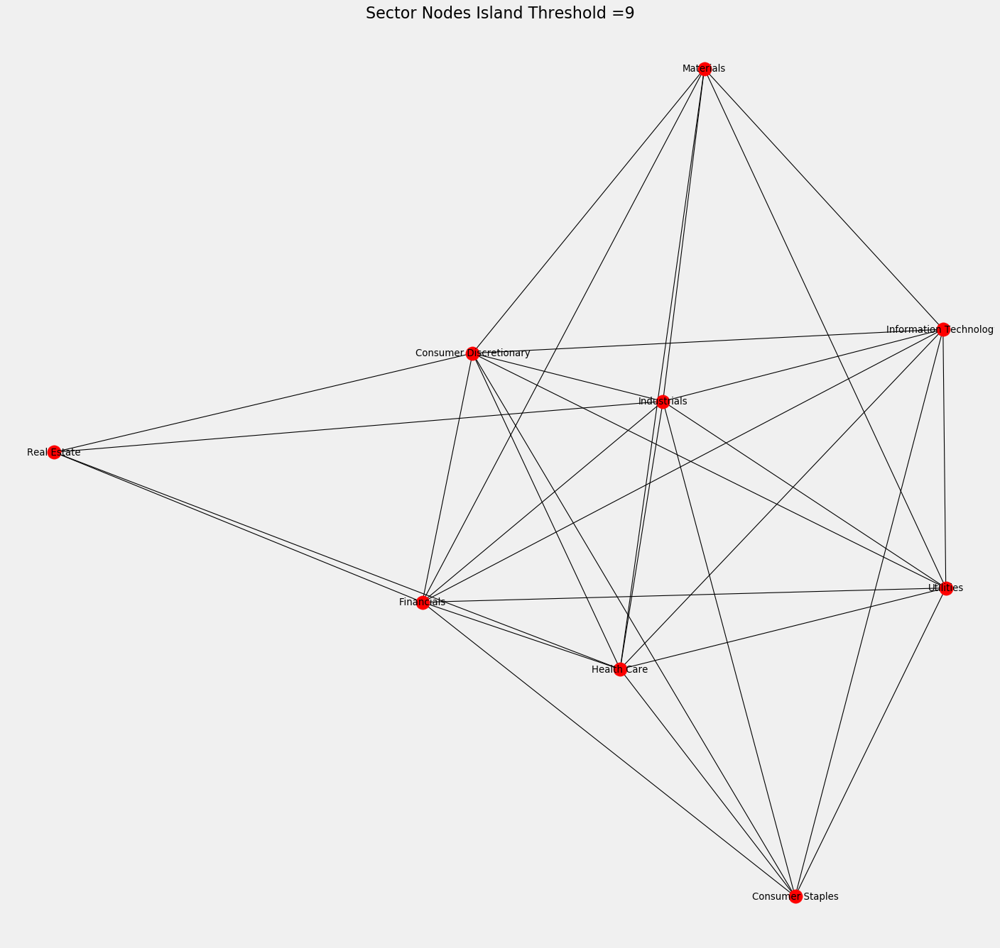

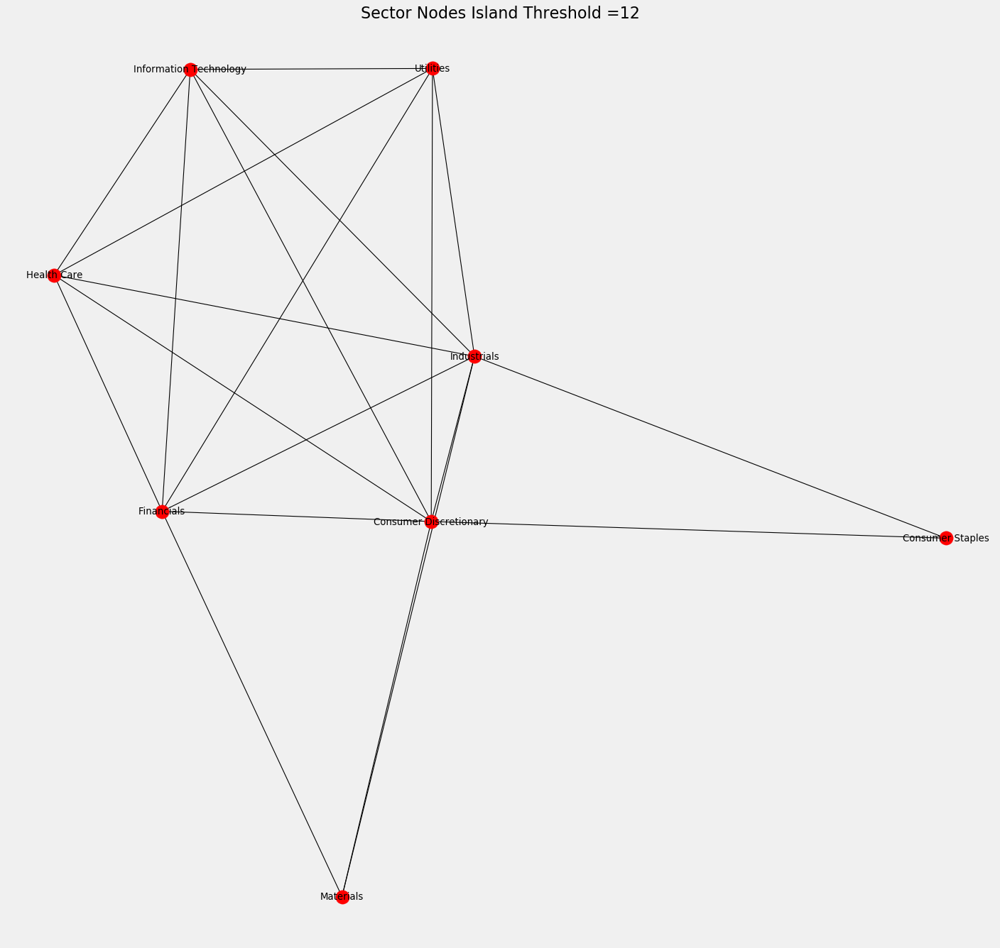

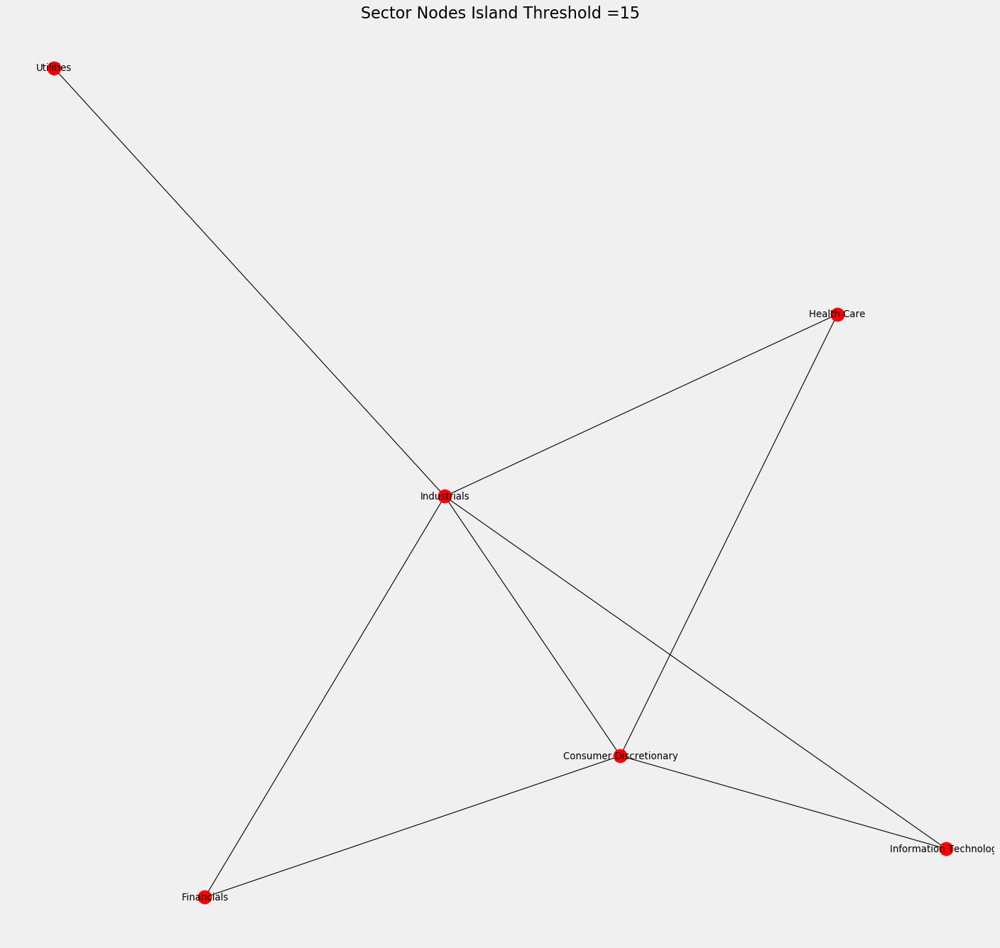

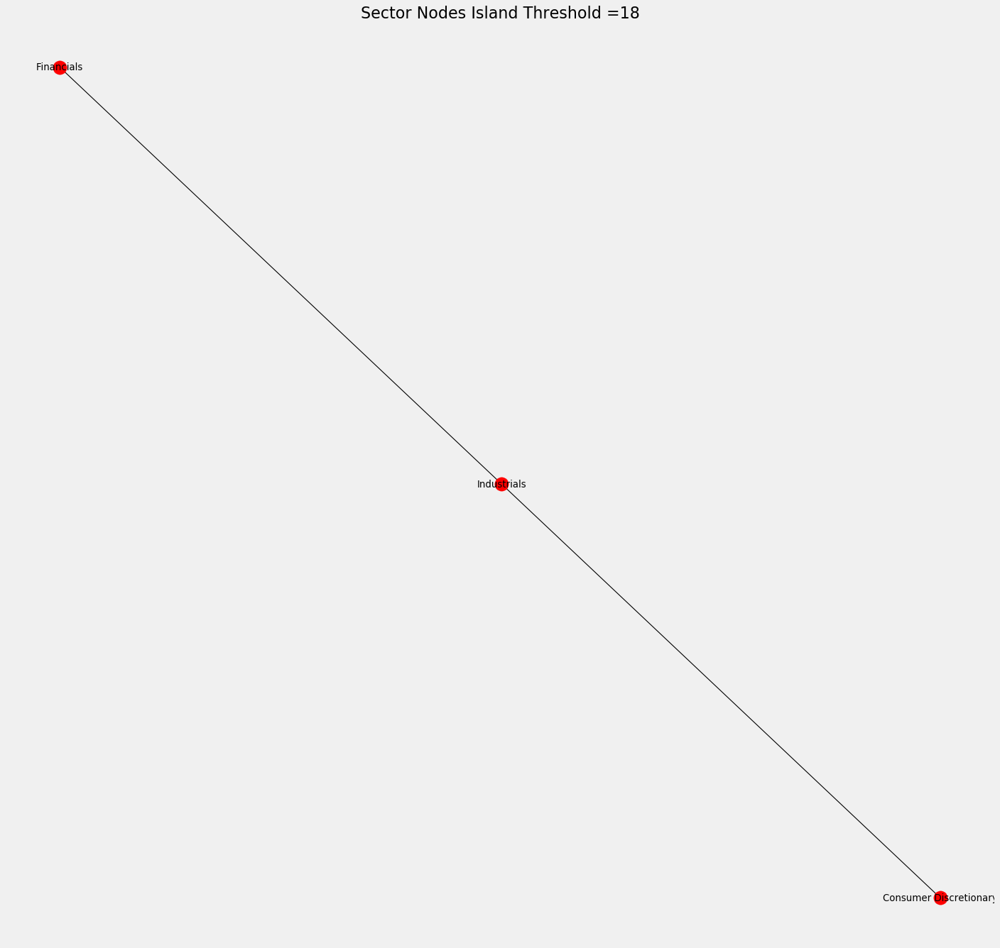

In [161]:
for i in range(len(state_island2)):
    #Visualize sub-networks (islands)
    pos = nx.spring_layout(state_island2[i][1])
    plt.figure(num=None, figsize=(20, 20), dpi=80)
    plt.axis('off')
    fig = plt.figure(1)
    nx.draw_networkx_nodes(state_island2[i][1],pos, node_color = 'r')
    nx.draw_networkx_edges(state_island2[i][1],pos, node_color = 'r')
    nx.draw_networkx_labels(state_island2[i][1],pos)
    plt.title('Sector Nodes Island Threshold =' + str(state_island2[i][0]),size = 20)

    cut = 1.00
    plt.show()

#### Sector Projected Network - Island Method Analysis
As seen in the visualization above, the sectors within specific sub-networks are now begginig to cluster together. In each slice of the network we start to see less promonant sectors drop off until we reach the last graph where you can see that Consumer Discretion, Industrials and Financials are the most prominent nodes in this network - which agrees with previous analysis. It is interesting to note that in this perspective, we were able to confirm our initial conclusions whereas siumply by looking at centrality measures, we could not.

## S&P 500 Network via Yahoo Finance
In order to gain more insight into companies featured in the S&P 500 we also generated networks using data pulled by the Yahoo Finance library available in the <code>pandas.datareader</code> library. Specifically we looked at the daily adjusted closing price and volume recorded for each day between the June 30, 2011 and June 30, 2021. Our workflow consisted of accessing the daily stock data for each company in the S&P 500 Index from the Yahoo Finance Api, transforming the data into correlation matricies for Volume and Adjusted Closing price, then finally generating networks based on each correlation matrix.  

In [162]:
#FOR S&P DATA THERE IS ONLY AVAILABLE FORTHE PAST 10 YEARS AND NOT BEFORE
#Start date: June 30, 2011; End date: June 30, 2021
end = dt.date(2021, 6, 30)
start = dt.date(2011, end.month, end.day)

#GET LIST OF SYMBOLS FROM WEB SCRAPING SECTION ABOVE 
symList = list(df['Symbol'])

#changes to be made due to non matching of symbols
symList[64] = 'BRK-B' #from 'BRK.B'
symList[77]  = 'BF-A' #from BF.B

#puts all time series data for all companies in a list
yahooTimeData = []

deleted =[]
for i in symList:
    try:
        yahooTimeData.append(pd.DataFrame(reader.DataReader(i, 'yahoo', start=start, end=end)))
    except KeyError:
        deleted.append(i)
        pass

In [163]:
#preview yahoo data (first element)
print(yahooTimeData[0])

                  High         Low        Open       Close     Volume  \
Date                                                                    
2011-06-30   95.059998   93.349998   93.379997   94.849998  4201800.0   
2011-07-01   96.949997   94.830002   94.830002   96.669998  4659700.0   
2011-07-05   96.860001   96.059998   96.400002   96.139999  3064200.0   
2011-07-06   97.500000   96.099998   96.120003   97.239998  3704100.0   
2011-07-07   98.190002   97.169998   97.730003   97.970001  3312100.0   
...                ...         ...         ...         ...        ...   
2021-06-24  193.740005  191.639999  193.300003  193.259995  2191800.0   
2021-06-25  195.330002  193.300003  193.419998  194.750000  6175500.0   
2021-06-28  196.919998  194.389999  195.759995  196.500000  2100500.0   
2021-06-29  197.830002  195.720001  196.199997  196.029999  1858000.0   
2021-06-30  198.979996  195.539993  195.899994  198.630005  2592000.0   

             Adj Close  
Date                    


In [164]:
#print the companies that were deleted from the list due to error
for i in deleted:
    yahooTimeData.append(pd.DataFrame(reader.DataReader(i, 'yahoo', start=start, end=end)))

In [165]:
#remove items from the list and append them at the end to preserve index and company symbol
for i in deleted:
    symList.remove(i) 
    symList.append(i)

In [166]:
# set up two tables - one for volume and one for adjusted closing prices. 
# each table has the table with dates on the left and metric on the right

#create lists to hold dataframes with time series of stock data for each company
vol = []
adjClose = []
j = 0;
#seperate into list of dataframes with the name of company as the column
for i in yahooTimeData:
    vol.append(pd.DataFrame({symList[j]:i['Volume'].values}, index = i.index))
    adjClose.append(pd.DataFrame({symList[j]:i['Adj Close'].values}, index = i.index))
    j+=1
    
#create one giant dataframe with volumes (companies as columns)
volDF = pd.DataFrame(index = vol[0].index) #set the index
for i in vol:
    volDF = volDF.merge(i, how='outer',on='Date')
print(volDF.head())

                  MMM         ABT  ABBV    ABMD         ACN       ATVI  \
Date                                                                     
2011-06-30  4201800.0  12069404.0   NaN  195000   9807200.0  6501800.0   
2011-07-01  4659700.0  11558566.0   NaN  217400   8136500.0  3530600.0   
2011-07-05  3064200.0  10492497.0   NaN   86000  89655900.0  2994700.0   
2011-07-06  3704100.0   7447895.0   NaN  127800  15294600.0  6093900.0   
2011-07-07  3312100.0  10280325.0   NaN  136500  13973000.0  7370700.0   

               ADBE       AMD        AAP        AES  ...      WLTW       WYNN  \
Date                                                 ...                        
2011-06-30  5519700  25379100  1452200.0  6323300.0  ...  308900.0  2006900.0   
2011-07-01  4218400  27641600   811200.0  3636300.0  ...  295800.0  2573700.0   
2011-07-05  3513400  16220600  1013000.0  7324500.0  ...  235400.0  1548900.0   
2011-07-06  2873100  13087600  1002200.0  6736300.0  ...  273900.0  1790500.

In [167]:
#create one giant dataframe with adjusted closing prices
adjCloseDF = pd.DataFrame(index = adjClose[0].index) #set the index
for i in adjClose:
    adjCloseDF = adjCloseDF.merge(i, how='outer',on='Date')
print(adjCloseDF.head())

                  MMM        ABT  ABBV       ABMD        ACN       ATVI  \
Date                                                                      
2011-06-30  72.144760  20.276720   NaN  16.200001  49.444202  10.718831   
2011-07-01  73.529076  20.461683   NaN  16.750000  49.812466  10.865664   
2011-07-05  73.125938  20.484802   NaN  16.700001  50.532600  10.828955   
2011-07-06  73.962624  20.531040   NaN  16.920000  50.819031  10.975789   
2011-07-07  74.517860  20.631229   NaN  16.850000  51.915596  11.049207   

                 ADBE   AMD        AAP        AES  ...       WLTW        WYNN  \
Date                                               ...                          
2011-06-30  31.450001  6.99  56.638248   9.773046  ...  88.458389  102.594597   
2011-07-01  31.530001  7.11  57.228920   9.957155  ...  88.716621  106.904518   
2011-07-05  31.520000  7.14  56.570450   9.849760  ...  88.587517  108.040955   
2011-07-06  31.650000  7.00  56.270271   9.949482  ...  89.190010  10

In [168]:
#calculate correlation between columns
volCorr = volDF.corr()
adjCloseCorr = adjCloseDF.corr()

In [169]:
#Display volume correlation matrix
print(volCorr.head())

           MMM       ABT      ABBV      ABMD       ACN      ATVI      ADBE  \
MMM   1.000000  0.356911  0.273728  0.093793  0.285511  0.151468  0.427818   
ABT   0.356911  1.000000  0.178812  0.040609  0.279875  0.149129  0.351621   
ABBV  0.273728  0.178812  1.000000  0.133400  0.186996  0.086961  0.170835   
ABMD  0.093793  0.040609  0.133400  1.000000 -0.001141  0.079317  0.026036   
ACN   0.285511  0.279875  0.186996 -0.001141  1.000000  0.070099  0.285668   

           AMD       AAP       AES  ...      WLTW      WYNN       XEL  \
MMM   0.052134  0.062717  0.265878  ...  0.089990  0.242896  0.285839   
ABT  -0.124988  0.036324  0.113737  ...  0.020951  0.104136  0.094883   
ABBV -0.026926  0.010918  0.103811  ...  0.048923  0.170360  0.197588   
ABMD  0.057217  0.050182  0.069016  ...  0.043768  0.058256  0.117987   
ACN  -0.103847  0.007922  0.114453  ... -0.010015  0.033903  0.134284   

          XLNX       XYL       YUM      ZBRA       ZBH      ZION       ZTS  
MMM   0.341372 

In [170]:
#Display adjusted closing correlation matrix
print(adjCloseCorr.head())

           MMM       ABT      ABBV      ABMD       ACN      ATVI      ADBE  \
MMM   1.000000  0.668199  0.808068  0.814761  0.750303  0.843018  0.667701   
ABT   0.668199  1.000000  0.882157  0.797238  0.977062  0.874076  0.983573   
ABBV  0.808068  0.882157  1.000000  0.862188  0.923309  0.944312  0.903849   
ABMD  0.814761  0.797238  0.862188  1.000000  0.838142  0.884840  0.823354   
ACN   0.750303  0.977062  0.923309  0.838142  1.000000  0.928771  0.981038   

           AMD       AAP       AES  ...      WLTW      WYNN       XEL  \
MMM   0.459747  0.670284  0.477742  ...  0.743331  0.283986  0.748264   
ABT   0.931294  0.595294  0.893894  ...  0.970080  0.044416  0.952415   
ABBV  0.804371  0.415956  0.728850  ...  0.898275  0.039581  0.866715   
ABMD  0.653994  0.558227  0.625668  ...  0.796144  0.136614  0.802059   
ACN   0.903997  0.625559  0.861171  ...  0.981324  0.050838  0.967249   

          XLNX       XYL       YUM      ZBRA       ZBH      ZION       ZTS  
MMM   0.712449 

In [171]:
#Create Initial Network (Volume)
#extracts the indices from the correlation matrix (stock code names)
indexVol = volCorr.index.values

#Changes from dataframe to matrix, so it is easier to create a graph with networkx
volCorrMatrix = np.asmatrix(volCorr)

######CREATE NETWORK GRAPH FROM CORRELATION MATRIX###
#Crates graph using the data of the correlation matrix
Gvol = nx.from_numpy_matrix(volCorrMatrix)

#relabels the nodes to match thestocks names
Gvol = nx.relabel_nodes(Gvol,lambda x: indexVol[x])

#copy of edges and weights
Gvol_edges = Gvol.copy()
Gvol_edges = Gvol_edges.edges(data = True)

#remove self correlations
for stock_1, stock_2, weights in Gvol_edges:
    if stock_1 == stock_2:
        Gvol.remove_edge(stock_1, stock_2)

#shows first 10 edges with their corresponding weights
list(Gvol.edges(data=True))[0:10]

[('MMM', 'ABT', {'weight': 0.35691084641064774}),
 ('MMM', 'ABBV', {'weight': 0.27372767901641837}),
 ('MMM', 'ABMD', {'weight': 0.09379292489564407}),
 ('MMM', 'ACN', {'weight': 0.28551084160712104}),
 ('MMM', 'ATVI', {'weight': 0.15146834996063627}),
 ('MMM', 'ADBE', {'weight': 0.42781776140918437}),
 ('MMM', 'AMD', {'weight': 0.05213381404015873}),
 ('MMM', 'AAP', {'weight': 0.06271676531237819}),
 ('MMM', 'AES', {'weight': 0.26587760417913847}),
 ('MMM', 'AFL', {'weight': 0.468464882739504})]

In [172]:
#Create Initial Network (Adjusted Closing)
#extracts the indices from the correlation matrix (stock code names)
indexClose = adjCloseCorr.index.values

#Changes from dataframe to matrix, so it is easier to create a graph with networkx
closeCorrMatrix = np.asmatrix(adjCloseCorr)

#Crates graph using the data of the correlation matrix
Gclose = nx.from_numpy_matrix(closeCorrMatrix)

#relabels the nodes to match thestocks names
Gclose = nx.relabel_nodes(Gclose,lambda x: indexClose[x])

#copy of edges and weights
Gclose_edges = Gclose.copy()
Gclose_edges = Gclose_edges.edges(data = True)

#remove self correlations
for stock_1, stock_2, weights in Gclose_edges:
    if stock_1 == stock_2:
        Gclose.remove_edge(stock_1, stock_2)
#shows the first 10 edges with their corresponding weights
list(Gclose.edges(data=True))[0:10]

[('MMM', 'ABT', {'weight': 0.6681992796811413}),
 ('MMM', 'ABBV', {'weight': 0.808067869887896}),
 ('MMM', 'ABMD', {'weight': 0.8147607402140459}),
 ('MMM', 'ACN', {'weight': 0.7503025696933329}),
 ('MMM', 'ATVI', {'weight': 0.8430184478050695}),
 ('MMM', 'ADBE', {'weight': 0.667701431849677}),
 ('MMM', 'AMD', {'weight': 0.45974698795819174}),
 ('MMM', 'AAP', {'weight': 0.6702842322350162}),
 ('MMM', 'AES', {'weight': 0.47774222265736127}),
 ('MMM', 'AFL', {'weight': 0.8549613814237388})]

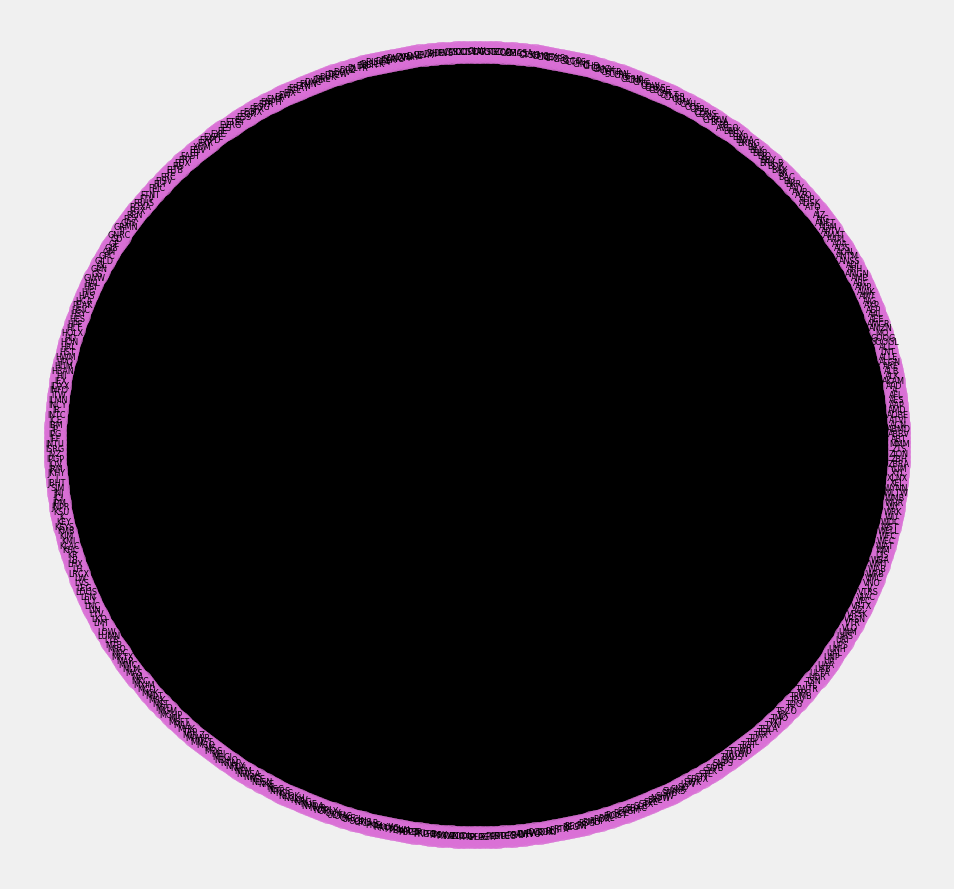

In [173]:
#function to create and display networks from the correlatin matrix. 
def create_corr_network_1(G):
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

    #positions
    positions=nx.circular_layout(G)
    
    #Figure size
    plt.figure(figsize=(15,15))

    #draws nodes
    nx.draw_networkx_nodes(G,positions,node_color='#DA70D6',
                           node_size=500,alpha=0.8)
    
    #Styling for labels
    nx.draw_networkx_labels(G, positions, font_size=8, 
                            font_family='sans-serif')
        
    #draws the edges
    nx.draw_networkx_edges(G, positions, edge_list=edges,style='solid')
    
    # displays the graph without axis
    plt.axis('off')
    plt.show() 

create_corr_network_1(Gvol)

In [174]:
print(nx.info(Gvol))

Name: 
Type: Graph
Number of nodes: 504
Number of edges: 126756
Average degree: 503.0000


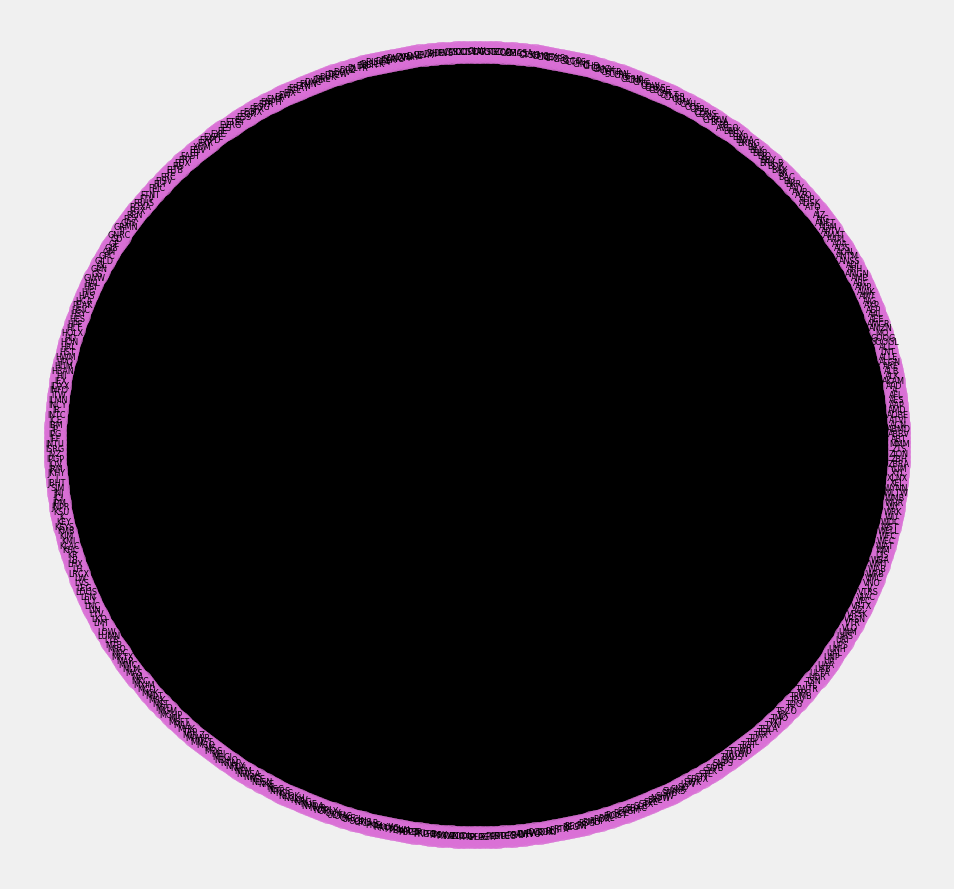

In [175]:
create_corr_network_1(Gclose)

In [176]:
print(nx.info(Gclose))

Name: 
Type: Graph
Number of nodes: 504
Number of edges: 126756
Average degree: 503.0000


From these initial networks we cannot really see any patterns between members because it is oversaturated with many nodes ande many edges. Below we employ some network reduction techniques to get a better sense of the positive correlations in the network. First we seperate the Volume and Adjusted Closing price into positive and negative correlation networks, then we use the island method to discover groupings of similar nodes that have similar correlations (highly correlated). 

In [177]:
#seperate between positive and negative correlations
def create_corr_network_PN(G):

    #Creates a copy of the graph
    H = G.copy()
    I = G.copy()

    #Checks all the edges and removes some based on corr_direction
    for stock1, stock2, weight in G.edges(data=True):
        #for positive delete the edges with weight smaller than 0
        if weight["weight"] < 0:
            H.remove_edge(stock1, stock2)
        #for negative delete edges with weights equal or less more than 0
        else:
            if weight["weight"] >= 0:
                I.remove_edge(stock1, stock2)
    return H, I

###Plotting function
def plot_stock_network(G, corr_direction, nodeHEXColor):
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())
    
    #positions
    positions=nx.circular_layout(G)
    
    #Figure size
    plt.figure(figsize=(15,15))

    #draws nodes
    nx.draw_networkx_nodes(G,positions,node_color=nodeHEXColor,
                           node_size=500,alpha=0.8)
    
    #Styling for labels
    nx.draw_networkx_labels(G, positions, font_size=8, 
                            font_family='sans-serif')
        
    #draws the edges
    nx.draw_networkx_edges(G, positions, edge_list=edges,style='solid')
    
    # displays the graph without axis
    plt.axis('off')
    plt.title('S&P Stock Correlation Network ' + corr_direction)
    plt.show() 

In [178]:
#create the networks Volume
posVol, negVol = create_corr_network_PN(Gvol)
#create the networks Adjusted Closing
posClose, negClose = create_corr_network_PN(Gclose)

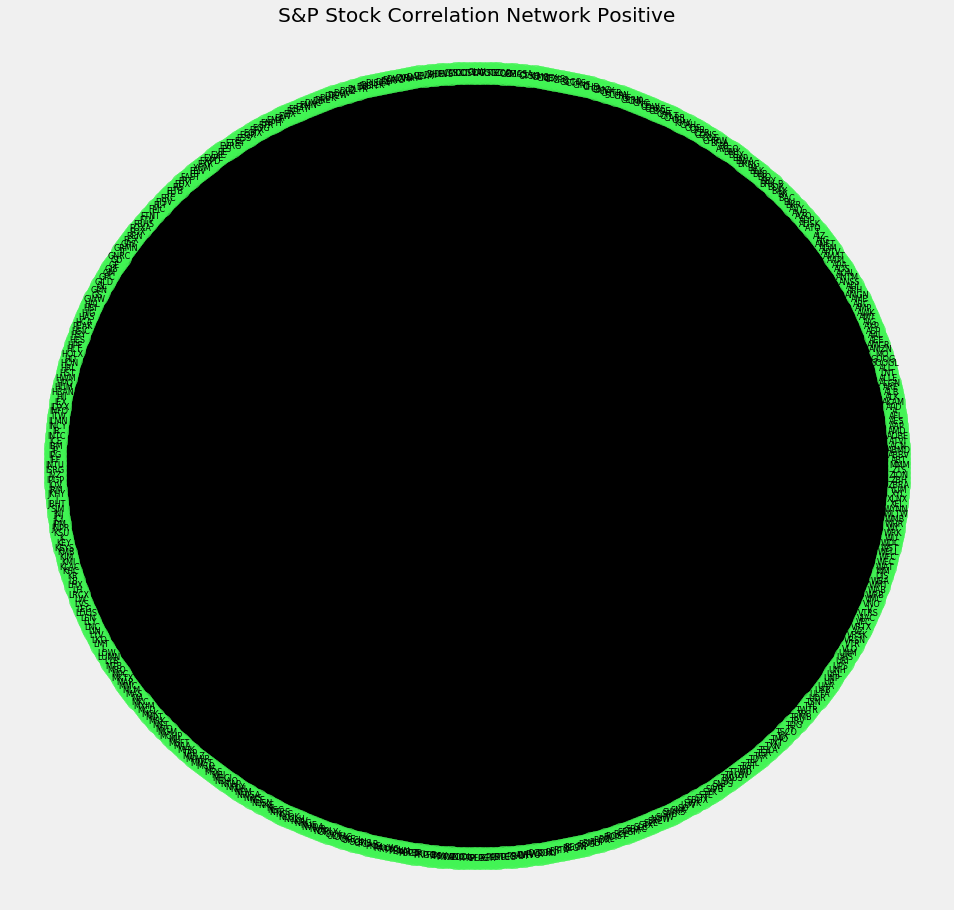

In [179]:
#plot posistive Network -  Volume
plot_stock_network(posVol, "Positive","#42f554")

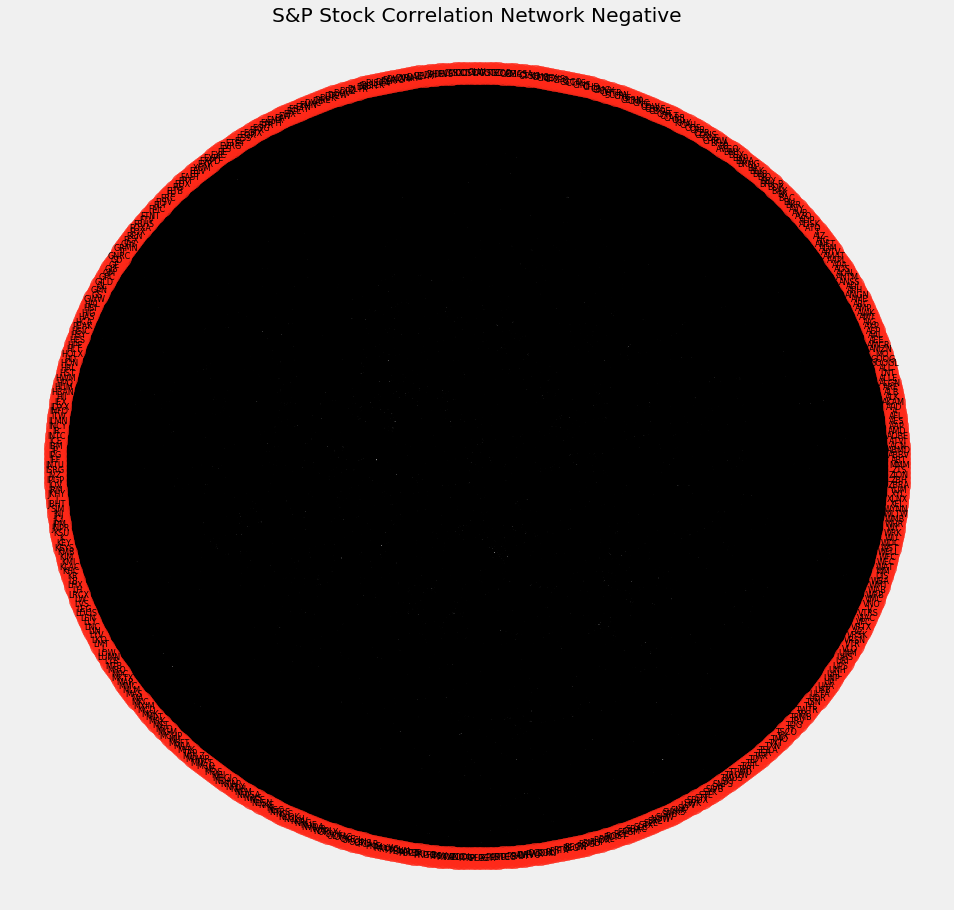

In [180]:
#plot negative Network - Volume
plot_stock_network(negVol, "Negative",'#ff2919')

These networks still look oversaturated and we cant really tell anything about each network still. We reduce the network further using a trimming method that focuses on retaining edges within a certain correlation coefficient. For our analysis for the volume network we chose to visualze the network with all edges that are above 60% correlation and 80% correlation.

In [181]:
#Trim Edges (any correlation below a certain decimal percent
def trim_edges2(G, decPercent):
    H = nx.Graph()
    for stock_1, stock_2, weight in G.edges(data=True): #checks if the value is less that decimal percent specified
        if abs(weight["weight"]) > decPercent:
            H.add_edge(stock_1, stock_2, weight = weight["weight"])
    return H

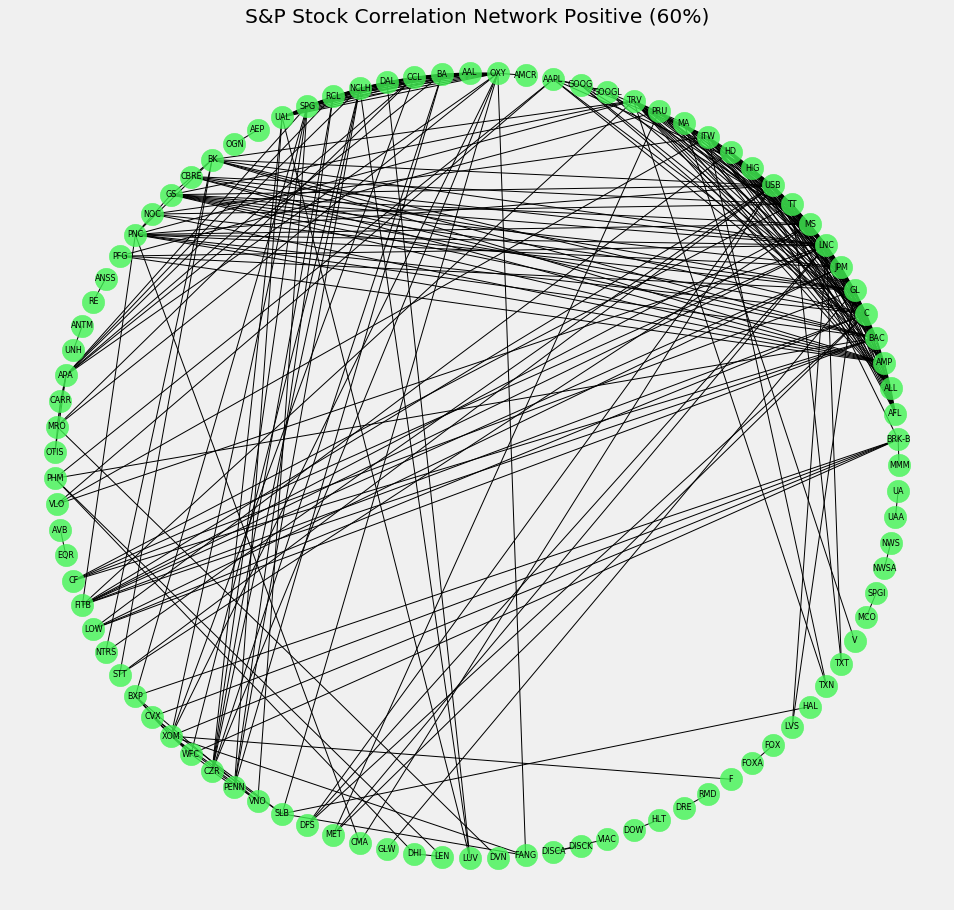

In [182]:
#VOLUME - Positive - 60%
posVol60 = trim_edges2(posVol, 0.6)
#plot network
plot_stock_network(posVol60, "Positive (60%)","#42f554")

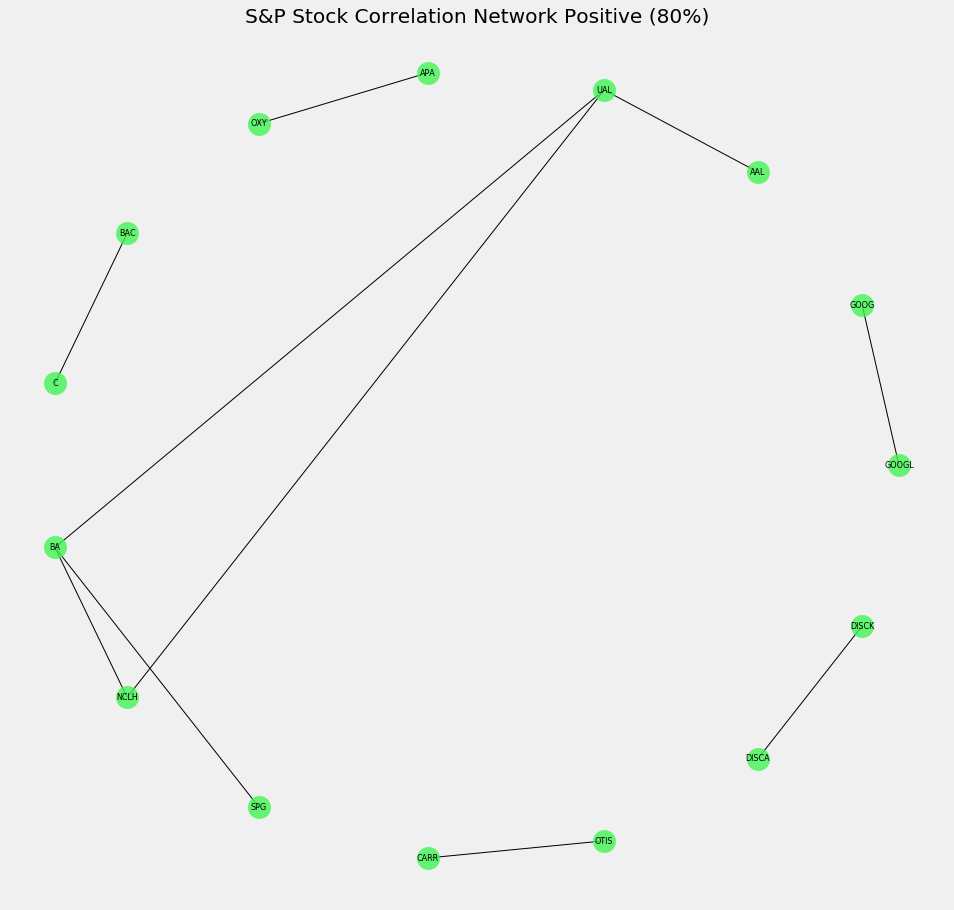

In [183]:
#VOLUME - Positive - 80%
posVol80 = trim_edges2(posVol, 0.8)
#plot network
plot_stock_network(posVol80, "Positive (80%)","#42f554")

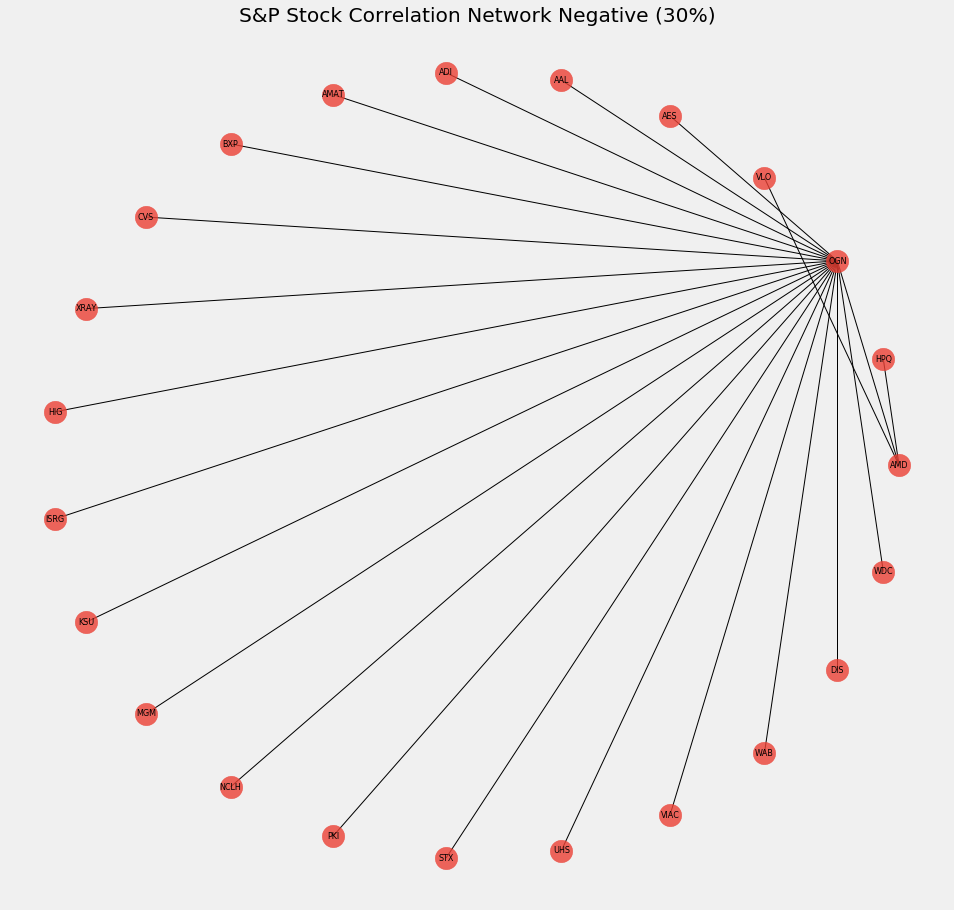

In [184]:
#Volume - Negative - 30% (highest negative correlation)
negVol30 = trim_edges2(negVol, 0.3)
#plot network
plot_stock_network(negVol30, "Negative (30%)","#eb4034")

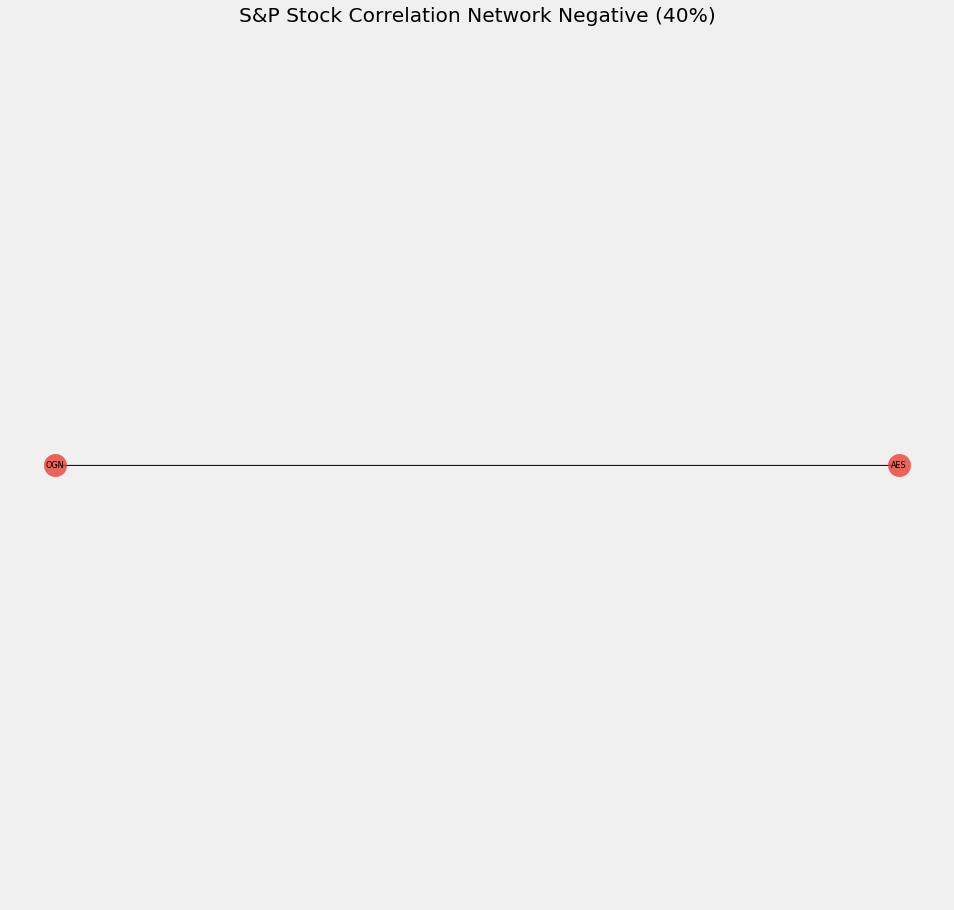

In [185]:
#Volume - Negative - 40% (highest negative correlation)
negVol40 = trim_edges2(negVol, 0.4)
#plot network
plot_stock_network(negVol40, "Negative (40%)","#eb4034")

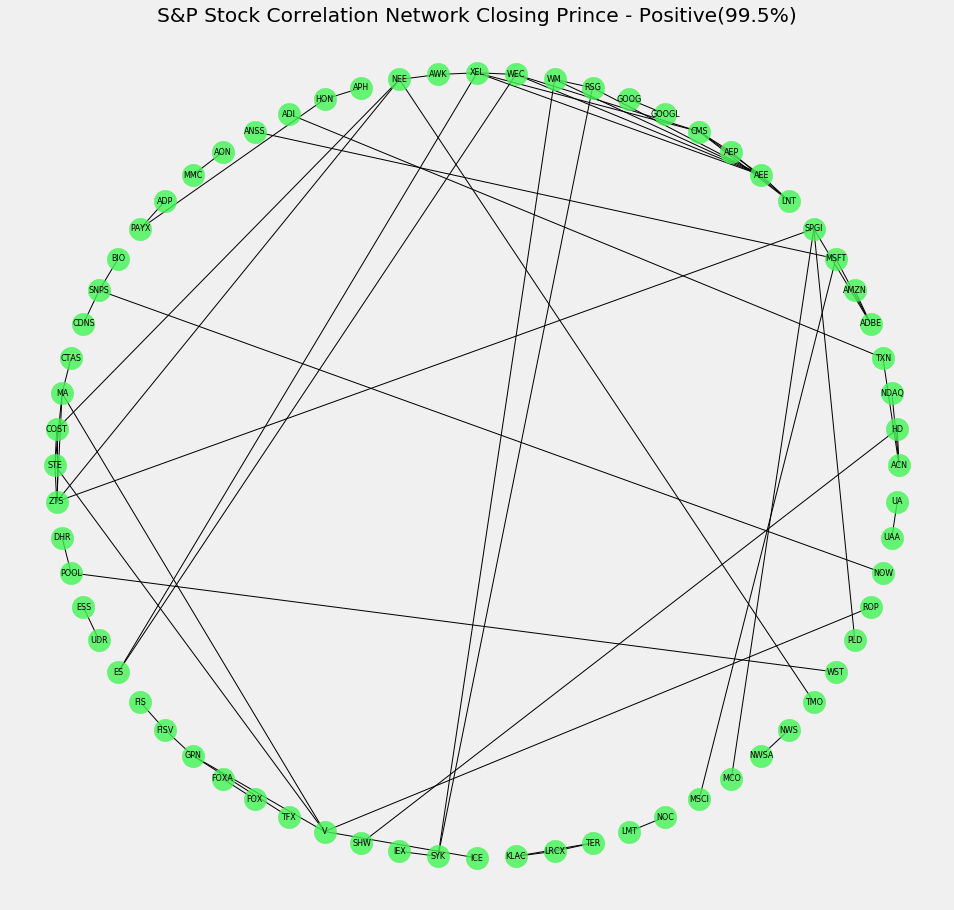

In [186]:
#Adjusted Closing - Positive - 99%
posClose99 = trim_edges2(posClose, 0.99)
#plot network
plot_stock_network(posClose99, "Closing Prince - Positive(99.5%)","#42f554")

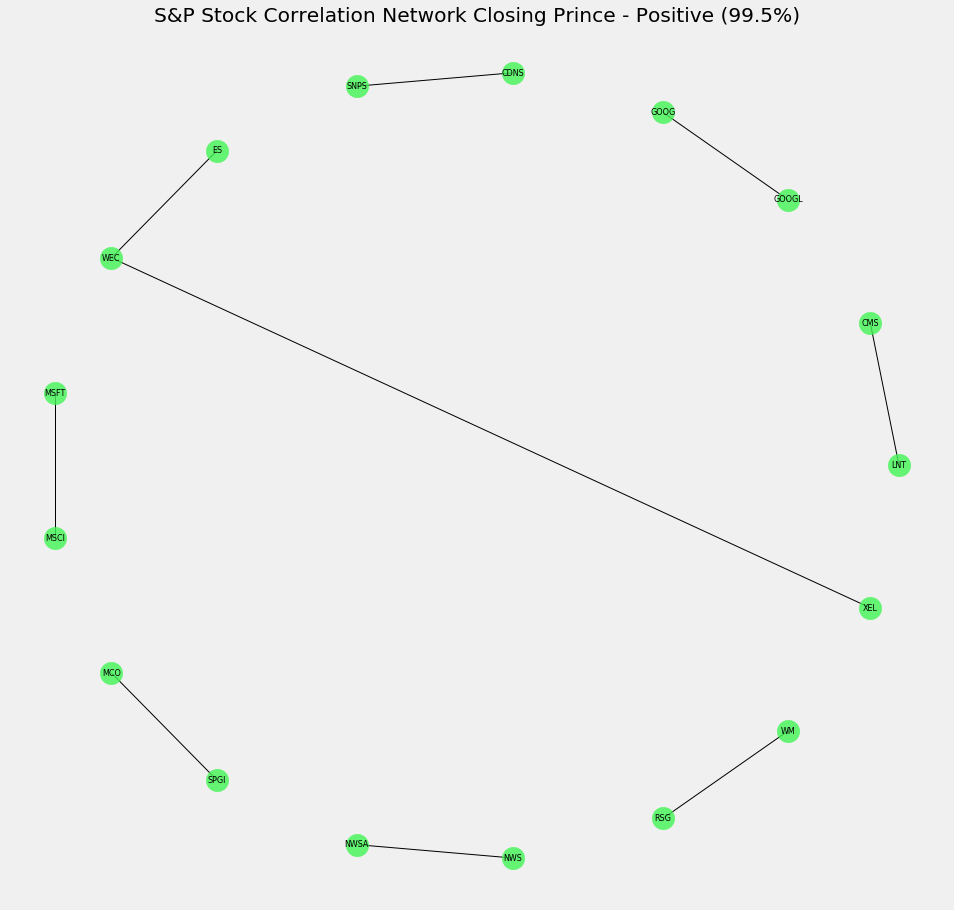

In [187]:
#Adjusted Closing - Positive - 99.5%
posClose995 = trim_edges2(posClose, 0.995)
#plot network
plot_stock_network(posClose995, "Closing Prince - Positive (99.5%)","#42f554")

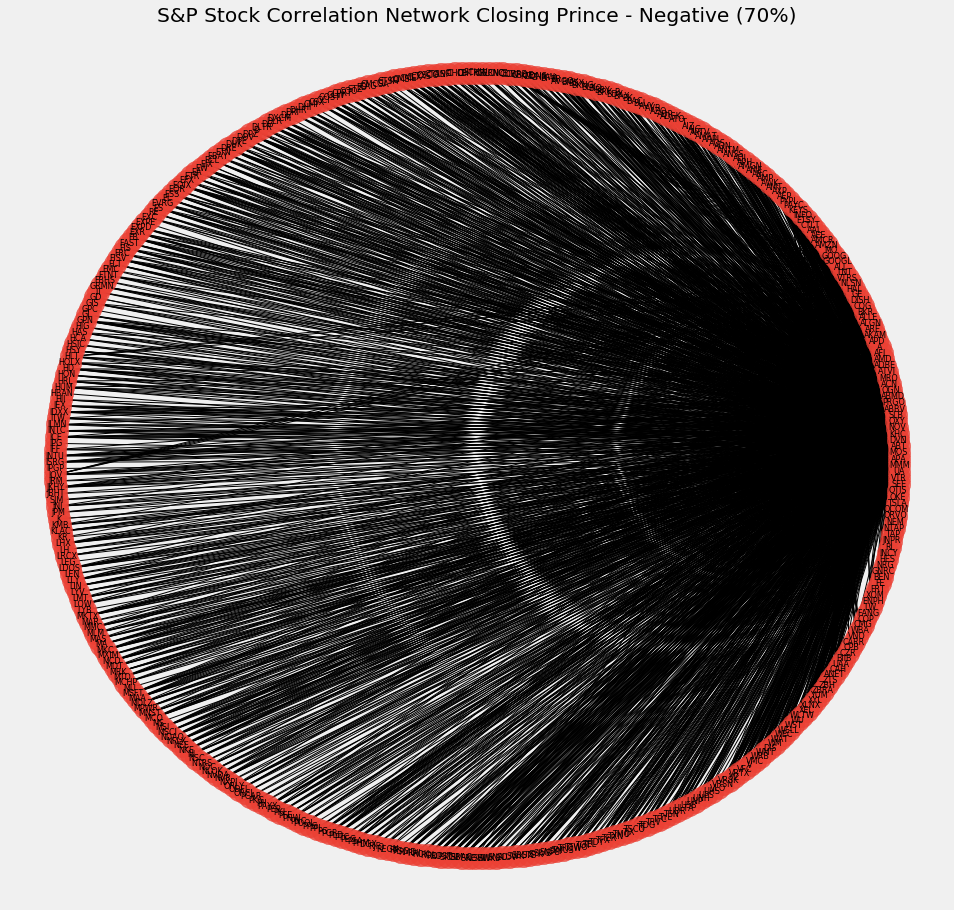

In [188]:
#Adjusted Closing - Negative - 70%
negClose70 = trim_edges2(negClose, 0.7)
#plot Network 
plot_stock_network(negClose70, "Closing Prince - Negative (70%)","#eb4034")

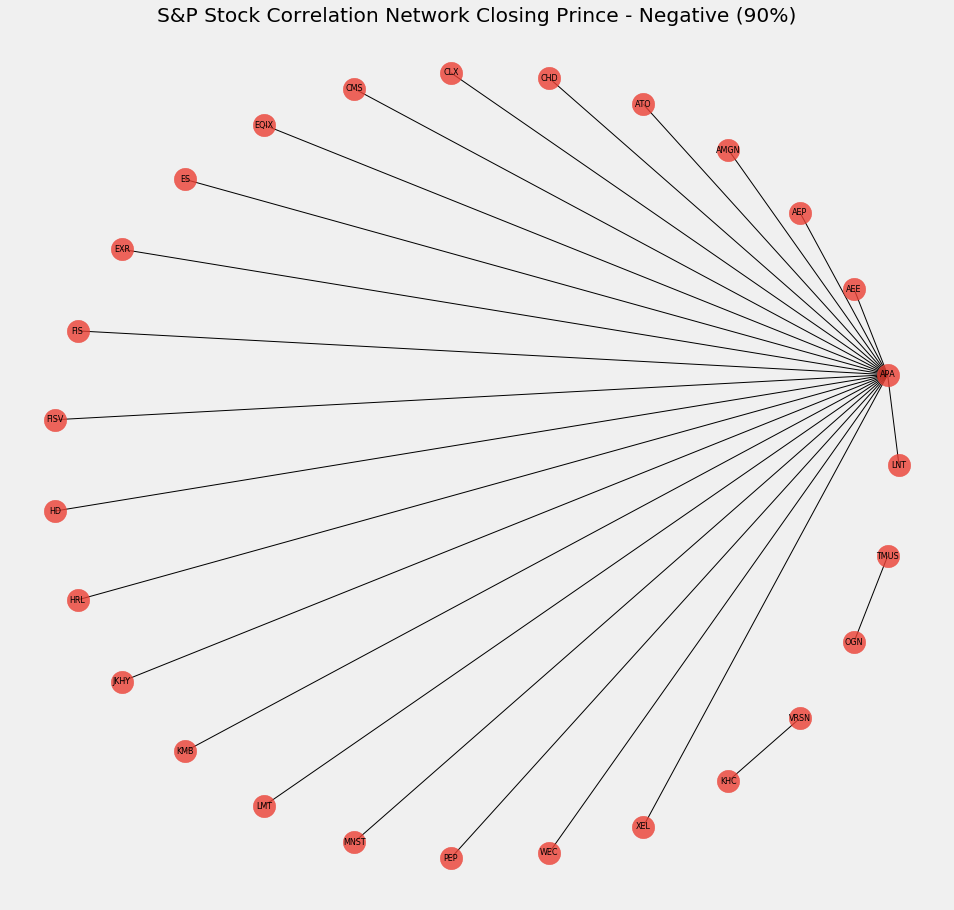

In [189]:
#Adjusted Closing - Negative - 90%
negClose90 = trim_edges2(negClose, 0.9)
#plot Network 
plot_stock_network(negClose90, "Closing Prince - Negative (90%)","#eb4034")

#### Centrality Measures
To help us get a quantitive idea of the relationship between nodes, we calculated measures of centrality and sorted them in the table using the same method as in the previous section (with wiki data).

In [190]:
#closeness (Volume)
volClose = nx.closeness_centrality(Gvol)
#betweenness  (Volume)
volBet = nx.betweenness_centrality(Gvol)
#eigenvector  (Volume)
volEig = nx.eigenvector_centrality(Gvol)

#put everything in a dataframe for easy comparison
VOLclosenessDF = pd.DataFrame.from_dict(volClose.items())
VOLclosenessDF.rename(columns={0: 'Company',1: 'Closeness'},inplace=True, errors='raise')

VOLbetweennessDF = pd.DataFrame.from_dict(volBet.items())
VOLbetweennessDF.rename(columns={0: 'Company',1: 'Betweenness'},inplace=True, errors='raise')

VOLeigenvectorDF = pd.DataFrame.from_dict(volEig.items())
VOLeigenvectorDF.rename(columns={0: 'Company',1: 'Eigenvector'},inplace=True, errors='raise')

In [191]:
VOLcentDF = VOLclosenessDF.merge(VOLbetweennessDF, how='outer',on='Company')
VOLcentDF = VOLcentDF.merge(VOLeigenvectorDF, how='outer',on='Company')
VOLcentDF.sort_values(by=['Closeness'],ascending=False)[0:10]

,Company,Closeness,Betweenness,Eigenvector
0,MMM,1.0,0.0,0.044544
331,NEM,1.0,0.0,0.044544
344,NRG,1.0,0.0,0.044544
343,NOV,1.0,0.0,0.044544
342,NCLH,1.0,0.0,0.044544
341,NLOK,1.0,0.0,0.044544
340,NOC,1.0,0.0,0.044544
339,NTRS,1.0,0.0,0.044544
338,NSC,1.0,0.0,0.044544
337,NI,1.0,0.0,0.044544


In [192]:
#closeness (VADJCLOSING)
adjClose = nx.closeness_centrality(Gclose)
#betweenness  (Volume)
adjBet = nx.betweenness_centrality(Gclose)
#eigenvector  (Volume)
adjEig = nx.eigenvector_centrality(Gclose)

#put everything in a dataframe for easy comparison
ADJclosenessDF = pd.DataFrame.from_dict(adjClose.items())
ADJclosenessDF.rename(columns={0: 'Company',1: 'Closeness'},inplace=True, errors='raise')

ADJbetweennessDF = pd.DataFrame.from_dict(adjBet.items())
ADJbetweennessDF.rename(columns={0: 'Company',1: 'Betweenness'},inplace=True, errors='raise')

ADJeigenvectorDF = pd.DataFrame.from_dict(adjEig.items())
ADJeigenvectorDF.rename(columns={0: 'Company',1: 'Eigenvector'},inplace=True, errors='raise')

ADJcentDF = ADJclosenessDF.merge(ADJbetweennessDF, how='outer',on='Company')
ADJcentDF = ADJcentDF.merge(ADJeigenvectorDF, how='outer',on='Company')
ADJcentDF.sort_values(by=['Closeness'],ascending=False)[0:10]

,Company,Closeness,Betweenness,Eigenvector
0,MMM,1.0,0.0,0.044544
331,NEM,1.0,0.0,0.044544
344,NRG,1.0,0.0,0.044544
343,NOV,1.0,0.0,0.044544
342,NCLH,1.0,0.0,0.044544
341,NLOK,1.0,0.0,0.044544
340,NOC,1.0,0.0,0.044544
339,NTRS,1.0,0.0,0.044544
338,NSC,1.0,0.0,0.044544
337,NI,1.0,0.0,0.044544


In [193]:
#Number of Connections for positive correlated network above 80%
pd.DataFrame(list(posVol80.degree()))

,0,1
0,GOOGL,1
1,GOOG,1
2,AAL,1
3,UAL,3
4,APA,1
5,OXY,1
6,BAC,1
7,C,1
8,BA,3
9,NCLH,2


### Correlation Networks Analysis
As we can see in the above correlation network analysis, networks associated with positive and negative correlations behave differently when it comes to correlations between Volume and Adjusted Closing Prices. For this specific project we focused on identfying the company with the highest correlation to other companies based on their stock volume behavior over time. As seen in the Positive 80% network visualization and print out of edges above, the Boeing company leads in that it is highly positivley correlated to the most companies in the S&P500. This leads us to our next section conducting sentiment analysis. 

## Boeing Company Twitter Analysis
As stated above we chose Boeing as a company to conduct some twitter analysis for because in our analysis it showed to be a node that contained more connections in the highly correlated network, than any other company. It is strongly connected to other airlies and energy companies. Twitter data regarding Boeing was accessed through the Twitter API.

In [194]:
#some extra libraries
from afinn import Afinn
from datetime import datetime
from datetime import timezone
plt.style.use('fivethirtyeight')

In [195]:
# Importing Twitter Api credential. 
#Credentials such as consumer key, consumer secret was added through a CSV file for security reason.
log1 = pd.read_csv('https://raw.githubusercontent.com/akarimhammoud/DATA-620/main/Week_6_final%20project/login.csv')
ckey=log1['Key'][0]
cs=log1['Key'][1]
at = log1['Key'][2]
ats = log1['Key'][3]

#create the twitter authentication
aunthenticate = tweepy.OAuthHandler(ckey,cs)
aunthenticate.set_access_token(at,ats)
api = tweepy.API(aunthenticate,wait_on_rate_limit=True)

## Around 3238 tweets regarding Boeing is extracted.
searchQuery = 'Boeing' # this is what we're searching for
maxTweets = 10000 # number of tweets to go througg
tweetsPerQry = 100 # this is the max the API permits
fNameb = 'tweetsb.txt' # We'll store the tweets in a text file..

In [196]:
#Extracting tweets regarding boeing from Twitter.
#Search Query was implemented regarding Boeing
#Boeing Twitter account was utilized to get the tweets.
# If results from a specific ID onwards are reqd, set since_id to that ID.
# else default to no lower limit, go as far back as API allows
sinceId = None

# If results only below a specific ID are, set max_id to that ID.
# else default to no upper limit, start from the most recent tweet matching the search query.
max_id=-1
tweetCount = 0
#print("Downloading max {0} tweets".format(maxTweets))
with open(fNameb, 'w') as f:
    while tweetCount < maxTweets:
        try:
            if (max_id <= 0):
                if (not sinceId):
                    new_tweets = api.user_timeline(screen_name = searchQuery, # user_id=tweeters,
                                include_rts=True,
                                exclude_replies =False,
                                count=tweetsPerQry)
                else:
                    new_tweets = api.user_timeline(screen_name = searchQuery, # user_id=tweeters,
                                include_rts=True,
                                exclude_replies =False,
                                count=tweetsPerQry,
                                max_id=str(max_id - 1),
                                since_id=sinceId)
            else:
                if (not sinceId):
                    new_tweets = api.user_timeline(screen_name = searchQuery, # user_id=tweeters,
                                include_rts=True,
                                exclude_replies =False, 
                                count=tweetsPerQry,
                                max_id=str(max_id - 1))
                else:
                    new_tweets = api.user_timeline(screen_name = searchQuery, # user_id=tweeters,
                                include_rts=True,
                                exclude_replies =False, count=tweetsPerQry,
                                            max_id=str(max_id - 1),
                                            since_id=sinceId)
            if not new_tweets:
                #print("No more tweets found")
                break
            for tweet in new_tweets:
                f.write(jsonpickle.encode(tweet._json, unpicklable=False) +
                        '\n')
            tweetCount += len(new_tweets)
            #print("Downloaded {0} tweets".format(tweetCount))
            max_id = new_tweets[-1].id
        except tweepy.TweepError as e:
            # Just exit if any error
            print("some error : " + str(e))
            break

In [197]:
#The data was stored as a json object.
tweets_data_path = 'tweetsb.txt'

tweets_data = []
tweets_file = open(tweets_data_path, "r")
for line in tweets_file:
    try:
        tweet = json.loads(line)
        tweets_data.append(tweet)
    except:
        continue

In [198]:
#number of data points
print(len(tweets_data))

3238


In [199]:
#tweets = pd.DataFrame() #create pandas dataframe
tweets['TimeStamp'] = list(map(lambda tweet: tweet['created_at'], tweets_data))
tweets['Name'] = list(map(lambda tweet: tweet["user"]["screen_name"], tweets_data))
tweets['text'] = list(map(lambda tweet: tweet['text'], tweets_data))
tweets['lang'] = list(map(lambda tweet: tweet['lang'], tweets_data))
tweets['tweet_id'] = list(map(lambda tweet: tweet['id'], tweets_data))
tweets['Favorites'] = list(map(lambda tweet: tweet['favorite_count'], tweets_data))
tweets['Retweet'] = list(map(lambda tweet: tweet['retweet_count'], tweets_data))
tweets['in_reply_to_status_id_str'] = list(map(lambda tweet: tweet['in_reply_to_status_id_str'], tweets_data))
tweets['in_reply_to_screen_name'] = list(map(lambda tweet: tweet['in_reply_to_screen_name'], tweets_data))

In [200]:
#Display
tweets.head()

,TimeStamp,Name,text,lang,tweet_id,Favorites,Retweet,in_reply_to_status_id_str,in_reply_to_screen_name,tweetos,date
0,Tue Jul 20 14:00:10 +0000 2021,Boeing,"Moscow International Air Show is back, and we’...",en,1417484479871004691,265,35,None,None,other,2021-07-20
1,Mon Jul 19 23:21:31 +0000 2021,Boeing,The Orbital Flight Test-2 #Starliner rolled ou...,en,1417263361516048384,446,102,None,None,other,2021-07-19
2,Wed Jul 14 12:26:47 +0000 2021,Boeing,"Sustainable aviation fuels, or SAF, offer the ...",en,1415286651425677314,92,20,None,None,other,2021-07-14
3,Tue Jul 13 18:30:05 +0000 2021,Boeing,Ready to take your career to the next level? H...,en,1415015692521418762,44,8,None,None,other,2021-07-13
4,Sun Jul 04 12:00:15 +0000 2021,Boeing,We're grateful for the unwavering spirit that ...,en,1411656096301948939,178,25,None,None,other,2021-07-04


In [201]:
#Cleaning tweets to have better understanding: 
#To clean the data we extracted the user name, 
#removed URL and RT,punctations and double space.
pd.options.mode.chained_assignment = None  # default='warn'
#extract the username through the tweets (preceded by @ or by RT @)
tweets['tweetos'] = '' 

#add tweetos first part
for i in range(len(tweets['text'])):
    try:
        tweets['tweetos'][i] = tweets['text'].str.split(' ')[i][0]
    except AttributeError:    
        tweets['tweetos'][i] = 'other'

#Preprocessing tweetos. select tweetos contains 'RT @'
for i in range(len(tweets['text'])):
    if tweets['tweetos'].str.contains('@')[i]  == False:
        tweets['tweetos'][i] = 'other' 
        
# remove URLs, RTs, and twitter handles
for i in range(len(tweets['text'])):
    tweets['text'][i] = " ".join([word for word in tweets['text'][i].split()
                                if 'http' not in word and '@' not in word and '<' not in word])

In [202]:
#delete certains punctuations, put the text in lower case and delete the double space with the function apply
import re
tweets['text'] = tweets['text'].apply(lambda x: re.sub('[!@#$:).;,?&]', '', x.lower()))
tweets['text'] = tweets['text'].apply(lambda x: re.sub('  ', ' ', x))
tweets['text'][0]

'moscow international air show is back and we’ll be there in person on july 20-25 discussing our passenger and frei…'

In [203]:
#Cleaning date column: 
#Timestamp was formatted to datetime format to make it 
#uniform to the Yahoo Finance dataset regarding Boeng.
tweets['TimeStamp'] = pd.to_datetime(tweets['TimeStamp'])
print (tweets)

                     TimeStamp    Name  \
0    2021-07-20 14:00:10+00:00  Boeing   
1    2021-07-19 23:21:31+00:00  Boeing   
2    2021-07-14 12:26:47+00:00  Boeing   
3    2021-07-13 18:30:05+00:00  Boeing   
4    2021-07-04 12:00:15+00:00  Boeing   
...                        ...     ...   
3233 2012-04-20 12:44:58+00:00  Boeing   
3234 2012-04-19 16:57:37+00:00  Boeing   
3235 2012-04-19 14:09:28+00:00  Boeing   
3236 2012-04-18 19:37:07+00:00  Boeing   
3237 2012-04-18 19:24:53+00:00  Boeing   

                                                   text lang  \
0     moscow international air show is back and we’l...   en   
1     the orbital flight test-2 starliner rolled out...   en   
2     sustainable aviation fuels or saf offer the gr...   en   
3     ready to take your career to the next level he...   en   
4     we're grateful for the unwavering spirit that ...   en   
...                                                 ...  ...   
3233  rt boeing sign agreement on mission suppo

In [204]:
#Extract Data from yahoo finance api
tweets['TimeStamp'] = pd.to_datetime(tweets['TimeStamp'], unit='s')
tweets['date'] = pd.to_datetime(tweets['TimeStamp'].apply(lambda date: date.date()))
ba = tweets[tweets['Name'] == 'Boeing']
ba_stock = yf.Ticker('BA')
start = min(ba['date'])
end = max(ba['date'])
ba_stock= ba_stock.history(start=start.date(), end=end.date())

#Display Boeing Stock
ba_stock

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2012-04-18,60.097532,60.636593,60.007687,60.203709,2248900,0.0,0
2012-04-19,60.220052,60.407904,59.346114,59.705486,3729300,0.0,0
2012-04-20,59.844352,60.465095,59.705504,60.073051,4302100,0.0,0
2012-04-23,59.370620,59.729992,58.945899,59.509468,5022100,0.0,0
2012-04-24,59.795338,60.228222,59.435959,59.795338,3664500,0.0,0
...,...,...,...,...,...,...,...
2021-07-13,232.270004,234.490005,228.160004,228.199997,21029500,0.0,0
2021-07-14,229.020004,230.520004,224.300003,224.449997,12137000,0.0,0
2021-07-15,222.880005,226.669998,220.800003,222.759995,12228600,0.0,0


Firstly, we would like to find out if the amount of tweets from the Boeing twitter account affects the volume traded for that company. To do that,we made use of the pandas <code>shift</code> method to shift the entire timeseries back by 1 period. By doing so, we will be able to compare the effects of the volume of tweets the day before a specific share price. We have also decided to plot the volume traded and the volume of tweets in the same graph to visualise the data for a overview of the relationship between these 2 variables. To get a clearer picture of how these two variables are correlated, we had to use the pandas <code>rolling</code> method to get the average of 30 day window to have a clearer senses of the trends for a time period.

In [205]:
#acces the stocks
ba_stock = yf.Ticker("BA").history(start=min(ba['date']).date(),end=max(ba['date']).date())

#This function plots the tweets and stocks on the same graph
def tweet_vol_affect(tweets,stocks,title):
    tweet_shift1 = tweets.groupby('date').size().shift(-1).dropna() 
    stock_data = stocks['Volume'].dropna()
    corr, pval = stat.spearmanr(tweet_shift1.reindex(stock_data.index), stock_data,nan_policy='omit')
    tweets_vol = tweets.groupby('date').size().rolling(30).mean().dropna()
    stocks_data = stocks['Volume'].rolling(30).mean().dropna()
    fig = plt.figure(figsize=(16,8))
    ax1 = fig.add_subplot()
    ax2 = fig.add_subplot()
    ax2 = ax1.twinx()
    ax1.plot(tweets_vol.index,tweets_vol,label='Tweet Volume')
    ax2.plot(stocks_data.index,stocks_data,color='orange',label='Trade Volume')
    ax2.set_title(title+" \n Spearman correlation: corr={0:.5f} pval={1:.5f}".format(corr,pval))
    
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc=0)
    plt.show()

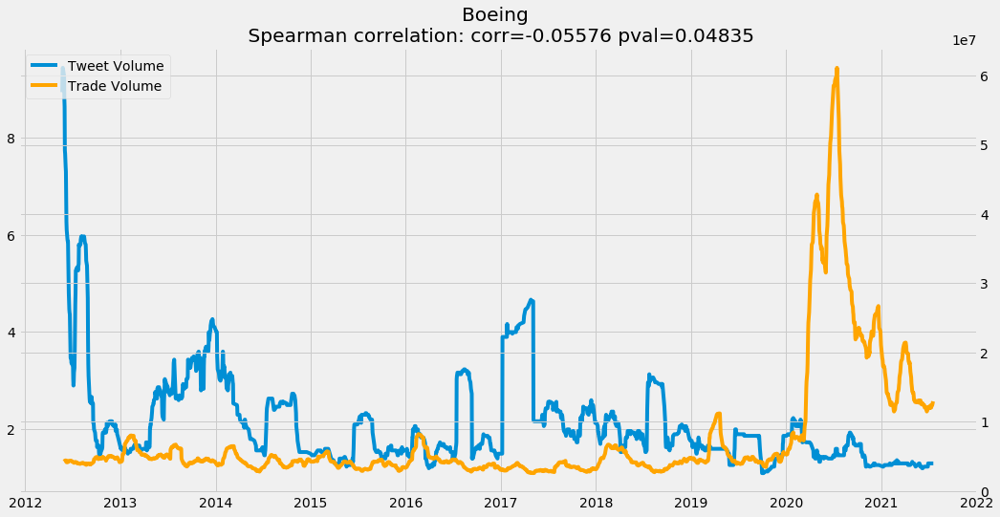

In [206]:
#supress warning and plot
warnings.filterwarnings("ignore",category=plt.cbook.mplDeprecation)
tweet_vol_affect(ba,ba_stock,"Boeing")

There is a negative correlation between tweets and trading volume until 2018 when tweets were high the trading volume was low. However,around 2020 the tweeting about Boeing went down and the trading volume went up. COVID 19 might have an affect regarding lower buzz on the Twitter due to the fact that there were less people able to travel during that time and some airlines were forced to close operations. 

### Sentiment Analysis
In order to identify the sentiment of the tweets, we will be using the Afinn library. In general, the <code>afinn</code> library will be able to provide a score where 0 is neutral, negative values indicate negative sentiments while postive values would indicate positive sentiments.

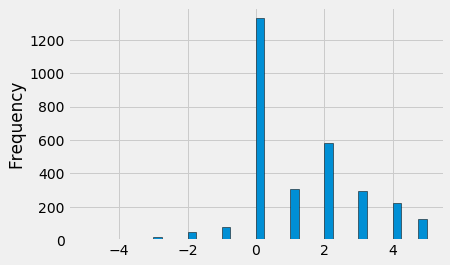

In [207]:
#create a new object
afinn = Afinn()

#Apply the .score method to gain a sentiments "score" for the tweet
ba['score'] =  ba['text'].apply(lambda tweet: afinn.score(tweet))

#plot the scores
ba.score.plot(kind='hist',range=(-5,5),bins=40,edgecolor='black')
plt.show()

The tweets regarding the Boeing company is mostly neutral.

In [208]:
#function that plots sentiments over time
def sentiment_overtime(tweets,stock,title):
    visual= tweets.groupby('date')['score'].mean().shift(-1).rolling(30).mean().dropna()
    corr_test = tweets.groupby('date')['score'].mean().shift(-1).dropna()
    corr, pval = stat.spearmanr(corr_test.reindex(stock.index), stock['Open'],nan_policy='omit')

    fig = plt.figure(figsize=(16,8))
    ax1 = fig.add_subplot()
    ax2 = fig.add_subplot()
    ax2 = ax1.twinx()
    
    ax1.plot(visual.index,visual,label='Tweets Sentiment')
    ax2.plot(stock.index,stock['Close'],color='orange',label='share price')
    ax2.set_title("Effects of "+title+" tweets to shareprice" +"\n Spearman correlation: corr={0:.5f} pval={1:.5f}".format(corr,pval))
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc=0)
    plt.show()

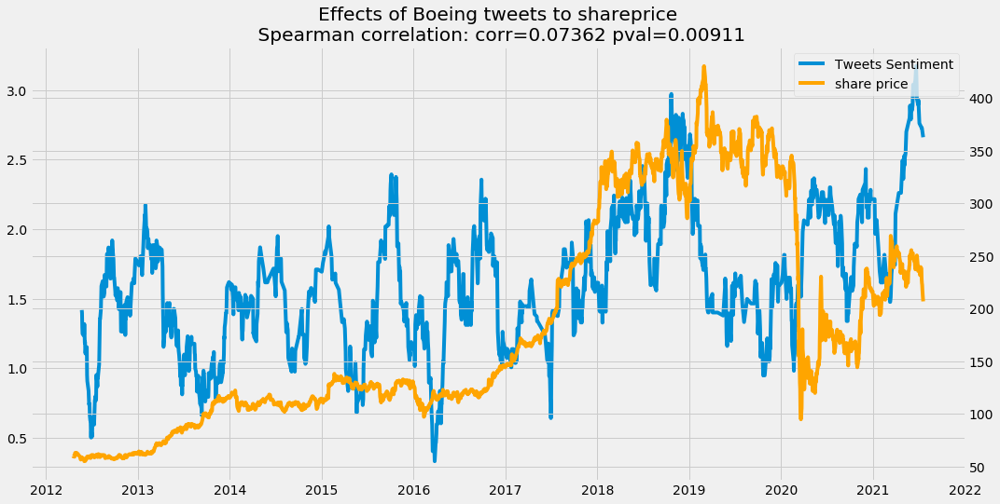

In [209]:
#plot
warnings.filterwarnings("ignore",category=plt.cbook.mplDeprecation)
sentiment_overtime(ba,ba_stock,"Boeing");

### Sentiment Conclusions
The correlation between the twitter sentiment of Boeing Twitter page and the stock price was not strong until 2018. However around 2018 the positive sentiment in Boeing Twitter has shown some positive relationship with the share price

However The tweets were extracted from Boeing Twitter webpage. We can observe that around 2016 the stock price went down, even though the Twitter accound was refecting positive sentiment. In 2016, Emirates Flight 521 was a scheduled international passenger flight from Thiruvananthapuram, India, to Dubai, United Arab Emirates, operated by Emirates using a Boeing 777-300. unfortunately, the aircraft carrying 282 passengers and 18 crew crashed while landing at Dubai International Airport.This shows the positive sentiment Boeing reflected on its' Twitter account has not improved the Stock price.

After the analysis it can be concluded Twitter account of Boeing has a negative correlation with the stock volume. And also somewhat opposite relationship with positive sentiment in their own twitter page and stock price.